In [1]:
from __future__ import print_function, division
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import datanew as dt
import model_4_op as md
import copy
from pytorch_ssim import ssim
from torch.utils.data import DataLoader
# e/d + i + p

In [24]:
# print gpu
torch.cuda.set_device(0)
currentDevice = torch.cuda.current_device()
print(torch.cuda.get_device_name(0))
print(currentDevice)
print("Current GPU: " + str(currentDevice))
print(str(torch.cuda.device_count()))
print(str(torch.cuda.get_device_capability(currentDevice)))
print(torch.__version__)

TITAN V
0
Current GPU: 0
8
(7, 0)
1.0.0


In [25]:
USE_GPU = 1
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = "cpu"
print(device)
torch.cuda.empty_cache()

cuda:0


In [ ]:
# generate csv file, run only for the first time
# dt.generate_csv()

In [5]:
csvFilePath = dt.get_csv_path()
transformed_dataset = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),                                     
                                               dt.Normalize(),
                                               dt.ToTensor()
                                           ]))

# for testing
transformed_dataset_raw = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),                                     
                                               dt.ToTensor()
                                           ]))

In [6]:
# batchsize 32->16
dataloader = DataLoader(transformed_dataset, batch_size=32,
                        shuffle=True, num_workers=0)

# for testing
dataloader_raw = DataLoader(transformed_dataset_raw, batch_size=32,
                        shuffle=True, num_workers=0)

In [ ]:
# TODO: insert back mean and variance to plot the image appropriately
dt.show_patch(dataloader) 

In [ ]:
dt.show_patch(dataloader_raw) 

In [ ]:
sample_test = dt.get_one_batch(dataloader_raw)

In [ ]:
sample, meanHE, stdHE, meanSHG, stdSHG = dt.normalizebatch(sample_test)

In [ ]:
dt.show_one_batch(sample, meanHE, stdHE, meanSHG, stdSHG)

In [7]:
print('===> Building model')
model = md.Net().to(device)
criterionMSE = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=0.001)


===> Building model


In [8]:
def train(epoch, p, windowsize):
    epoch_loss = 0
    for iteration, batch in enumerate(dataloader):
        input, target = batch['input'].to(device), batch['output'].to(device)

        optimizer.zero_grad()
        output = model(input)
        targetf = target.float()
        targetf = targetf[:, None]
        
        lossMSE = criterionMSE(output, targetf)      
        lossSSIM = 1-ssim(output, targetf, window_size=windowsize)
        
        # 0.75->0.4 after 3 epochs
        loss = p*lossMSE + (1-p)*lossSSIM
        combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
        
        epoch_loss = epoch_loss + combineLoss
        loss.backward()
        optimizer.step()
    
        if iteration%50 == 0:
            print("lossMSE: " + str(lossMSE.item()) +
                  " " + "lossSSIM: " + str(lossSSIM.item()))
            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(dataloader), loss.item()))

    print("===> Epoch {} Complete: Avg. Loss: {:.4f}".format(epoch, epoch_loss / len(dataloader)))


In [ ]:
# def test():
#     avg_psnr = 0
#     with torch.no_grad():
#         for batch in testing_data_loader:
#             input, target = batch[0].to(device), batch[1].to(device)

#             prediction = model(input)
#             mse = criterion(prediction, target)
#             psnr = 10 * log10(1 / mse.item())
#             avg_psnr += psnr
#     print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(testing_data_loader)))


In [ ]:
# def checkpoint(epoch):
#     model_out_path = "model_epoch_{}.pth".format(epoch)
#     torch.save(model, model_out_path)
#     print("Checkpoint saved to {}".format(model_out_path))

In [14]:
import matplotlib.pyplot as plt
from torchvision import transforms, utils
def test():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader_raw):
            batch, meanHE, stdHE, meanSHG, stdSHG = dt.normalizebatch(batch)
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()

            outdataloader = {'input':prediction,'output':target}
            
            print(outdataloader['input'].size(), 
                      outdataloader['output'].size())

            plt.figure()
            input_batch, label_batch = outdataloader['input'], outdataloader['output']
            batch_size = 32
            im_size = input_batch.size(2)
            label_batch=label_batch.reshape([batch_size,1,im_size,im_size])
            print(label_batch.size())
#             for img in input_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)
                            
#             for img in label_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)                           

            grid = utils.make_grid(input_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(label_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))

            plt.axis('off')
            plt.ioff()
            plt.show()
            
#             targetf = target[:, None]
            
#             lossMSE = criterionMSE(prediction, targetf)      
#             lossSSIM = -ssim(prediction, targetf)
        
#             p = 0.25
#             loss = p*lossMSE + (1-p)*lossSSIM
#             combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
# #             mse = criterion(prediction, target.float())

#             psnr = 10 * torch.log10(1 / loss)
#             avg_psnr += psnr
            if iteration == 16:
                break
#    print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(dataloader)))

In [10]:
l = 0.001
p = 0.75
windowsize = 4
for epoch in range(1, 20 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*0.5
        l = l*0.8
        if windowsize == 0:
            windowsze = 1
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    train(epoch, p, windowsize)

lossMSE: 0.309888631105423 lossSSIM: 0.9932149052619934
===> Epoch[1](0/25343): Loss: 0.4807
lossMSE: 0.21992065012454987 lossSSIM: 0.9389750361442566
===> Epoch[1](50/25343): Loss: 0.3997
lossMSE: 0.22309663891792297 lossSSIM: 0.9399890899658203
===> Epoch[1](100/25343): Loss: 0.4023
lossMSE: 0.21575605869293213 lossSSIM: 0.9338243007659912
===> Epoch[1](150/25343): Loss: 0.3953
lossMSE: 0.22703726589679718 lossSSIM: 0.9500573873519897
===> Epoch[1](200/25343): Loss: 0.4078
lossMSE: 0.2206663340330124 lossSSIM: 0.9433647990226746
===> Epoch[1](250/25343): Loss: 0.4013
lossMSE: 0.21714414656162262 lossSSIM: 0.9406930208206177
===> Epoch[1](300/25343): Loss: 0.3980
lossMSE: 0.2099798023700714 lossSSIM: 0.9368406534194946
===> Epoch[1](350/25343): Loss: 0.3917
lossMSE: 0.2133486568927765 lossSSIM: 0.9387649297714233
===> Epoch[1](400/25343): Loss: 0.3947
lossMSE: 0.21111668646335602 lossSSIM: 0.9344047904014587
===> Epoch[1](450/25343): Loss: 0.3919
lossMSE: 0.20733529329299927 lossSSIM:

lossMSE: 0.14543989300727844 lossSSIM: 0.9326774477958679
===> Epoch[1](4250/25343): Loss: 0.3422
lossMSE: 0.14230458438396454 lossSSIM: 0.9354225993156433
===> Epoch[1](4300/25343): Loss: 0.3406
lossMSE: 0.14344573020935059 lossSSIM: 0.9346742630004883
===> Epoch[1](4350/25343): Loss: 0.3413
lossMSE: 0.13629049062728882 lossSSIM: 0.9252246022224426
===> Epoch[1](4400/25343): Loss: 0.3335
lossMSE: 0.137111097574234 lossSSIM: 0.9304560422897339
===> Epoch[1](4450/25343): Loss: 0.3354
lossMSE: 0.14111171662807465 lossSSIM: 0.9347450733184814
===> Epoch[1](4500/25343): Loss: 0.3395
lossMSE: 0.1375173032283783 lossSSIM: 0.9330328106880188
===> Epoch[1](4550/25343): Loss: 0.3364
lossMSE: 0.1395910382270813 lossSSIM: 0.9318959712982178
===> Epoch[1](4600/25343): Loss: 0.3377
lossMSE: 0.1328149437904358 lossSSIM: 0.9232097268104553
===> Epoch[1](4650/25343): Loss: 0.3304
lossMSE: 0.13440722227096558 lossSSIM: 0.931022047996521
===> Epoch[1](4700/25343): Loss: 0.3336
lossMSE: 0.136212244629859

lossMSE: 0.08342448621988297 lossSSIM: 0.9153152704238892
===> Epoch[1](8450/25343): Loss: 0.2914
lossMSE: 0.08322422206401825 lossSSIM: 0.9106426239013672
===> Epoch[1](8500/25343): Loss: 0.2901
lossMSE: 0.08347553759813309 lossSSIM: 0.9084261655807495
===> Epoch[1](8550/25343): Loss: 0.2897
lossMSE: 0.08233865350484848 lossSSIM: 0.9095480442047119
===> Epoch[1](8600/25343): Loss: 0.2891
lossMSE: 0.08252041786909103 lossSSIM: 0.9096403121948242
===> Epoch[1](8650/25343): Loss: 0.2893
lossMSE: 0.08169642835855484 lossSSIM: 0.9075713753700256
===> Epoch[1](8700/25343): Loss: 0.2882
lossMSE: 0.08135543018579483 lossSSIM: 0.9102087020874023
===> Epoch[1](8750/25343): Loss: 0.2886
lossMSE: 0.08117517828941345 lossSSIM: 0.9184509515762329
===> Epoch[1](8800/25343): Loss: 0.2905
lossMSE: 0.08169569075107574 lossSSIM: 0.9299812912940979
===> Epoch[1](8850/25343): Loss: 0.2938
lossMSE: 0.07731631398200989 lossSSIM: 0.8992414474487305
===> Epoch[1](8900/25343): Loss: 0.2828
lossMSE: 0.079438224

lossMSE: 0.04603080824017525 lossSSIM: 0.8788984417915344
===> Epoch[1](12650/25343): Loss: 0.2542
lossMSE: 0.0470266118645668 lossSSIM: 0.8847558498382568
===> Epoch[1](12700/25343): Loss: 0.2565
lossMSE: 0.044302985072135925 lossSSIM: 0.8719303607940674
===> Epoch[1](12750/25343): Loss: 0.2512
lossMSE: 0.0467701330780983 lossSSIM: 0.8736198544502258
===> Epoch[1](12800/25343): Loss: 0.2535
lossMSE: 0.044448450207710266 lossSSIM: 0.874692440032959
===> Epoch[1](12850/25343): Loss: 0.2520
lossMSE: 0.045044075697660446 lossSSIM: 0.886247456073761
===> Epoch[1](12900/25343): Loss: 0.2553
lossMSE: 0.04552476108074188 lossSSIM: 0.8790706396102905
===> Epoch[1](12950/25343): Loss: 0.2539
lossMSE: 0.050161171704530716 lossSSIM: 0.8900517821311951
===> Epoch[1](13000/25343): Loss: 0.2601
lossMSE: 0.0409279465675354 lossSSIM: 0.8562254905700684
===> Epoch[1](13050/25343): Loss: 0.2448
lossMSE: 0.04342751204967499 lossSSIM: 0.8693555593490601
===> Epoch[1](13100/25343): Loss: 0.2499
lossMSE: 0.

lossMSE: 0.02505362220108509 lossSSIM: 0.8336961269378662
===> Epoch[1](16800/25343): Loss: 0.2272
lossMSE: 0.026065632700920105 lossSSIM: 0.8441494703292847
===> Epoch[1](16850/25343): Loss: 0.2306
lossMSE: 0.025482842698693275 lossSSIM: 0.8376678228378296
===> Epoch[1](16900/25343): Loss: 0.2285
lossMSE: 0.02743203192949295 lossSSIM: 0.8262897729873657
===> Epoch[1](16950/25343): Loss: 0.2271
lossMSE: 0.03676795959472656 lossSSIM: 0.8664159178733826
===> Epoch[1](17000/25343): Loss: 0.2442
lossMSE: 0.02465066872537136 lossSSIM: 0.8287656903266907
===> Epoch[1](17050/25343): Loss: 0.2257
lossMSE: 0.026539746671915054 lossSSIM: 0.8299921751022339
===> Epoch[1](17100/25343): Loss: 0.2274
lossMSE: 0.028933044523000717 lossSSIM: 0.8539913892745972
===> Epoch[1](17150/25343): Loss: 0.2352
lossMSE: 0.0240899957716465 lossSSIM: 0.8539641499519348
===> Epoch[1](17200/25343): Loss: 0.2316
lossMSE: 0.026043938472867012 lossSSIM: 0.8094632029533386
===> Epoch[1](17250/25343): Loss: 0.2219
lossMS

lossMSE: 0.026151146739721298 lossSSIM: 0.7158787250518799
===> Epoch[1](20950/25343): Loss: 0.1986
lossMSE: 0.02806244231760502 lossSSIM: 0.7392128705978394
===> Epoch[1](21000/25343): Loss: 0.2059
lossMSE: 0.03353460133075714 lossSSIM: 0.7291420102119446
===> Epoch[1](21050/25343): Loss: 0.2074
lossMSE: 0.028828918933868408 lossSSIM: 0.7306731343269348
===> Epoch[1](21100/25343): Loss: 0.2043
lossMSE: 0.026807058602571487 lossSSIM: 0.750001847743988
===> Epoch[1](21150/25343): Loss: 0.2076
lossMSE: 0.024578005075454712 lossSSIM: 0.7461441159248352
===> Epoch[1](21200/25343): Loss: 0.2050
lossMSE: 0.028809554874897003 lossSSIM: 0.742218017578125
===> Epoch[1](21250/25343): Loss: 0.2072
lossMSE: 0.022672737017273903 lossSSIM: 0.715367317199707
===> Epoch[1](21300/25343): Loss: 0.1958
lossMSE: 0.028350166976451874 lossSSIM: 0.7328640222549438
===> Epoch[1](21350/25343): Loss: 0.2045
lossMSE: 0.025400526821613312 lossSSIM: 0.7216675281524658
===> Epoch[1](21400/25343): Loss: 0.1995
lossM

lossMSE: 0.020985521376132965 lossSSIM: 0.6537395715713501
===> Epoch[1](25100/25343): Loss: 0.1792
lossMSE: 0.020314497873187065 lossSSIM: 0.6413266658782959
===> Epoch[1](25150/25343): Loss: 0.1756
lossMSE: 0.021497124806046486 lossSSIM: 0.6628624200820923
===> Epoch[1](25200/25343): Loss: 0.1818
lossMSE: 0.019530227407813072 lossSSIM: 0.623726487159729
===> Epoch[1](25250/25343): Loss: 0.1706
lossMSE: 0.021807411685585976 lossSSIM: 0.6290863752365112
===> Epoch[1](25300/25343): Loss: 0.1736
===> Epoch 1 Complete: Avg. Loss: 0.2678
lossMSE: 0.02373894490301609 lossSSIM: 0.6458473205566406
===> Epoch[2](0/25343): Loss: 0.1793
lossMSE: 0.020371142774820328 lossSSIM: 0.6120189428329468
===> Epoch[2](50/25343): Loss: 0.1683
lossMSE: 0.01985323056578636 lossSSIM: 0.6211014986038208
===> Epoch[2](100/25343): Loss: 0.1702
lossMSE: 0.023181920871138573 lossSSIM: 0.6569042205810547
===> Epoch[2](150/25343): Loss: 0.1816
lossMSE: 0.02237134426832199 lossSSIM: 0.6257345676422119
===> Epoch[2](2

lossMSE: 0.016866283491253853 lossSSIM: 0.5591168403625488
===> Epoch[2](3900/25343): Loss: 0.1524
lossMSE: 0.020794324576854706 lossSSIM: 0.5570882558822632
===> Epoch[2](3950/25343): Loss: 0.1549
lossMSE: 0.014128532260656357 lossSSIM: 0.5577450394630432
===> Epoch[2](4000/25343): Loss: 0.1500
lossMSE: 0.014966536313295364 lossSSIM: 0.5361576676368713
===> Epoch[2](4050/25343): Loss: 0.1453
lossMSE: 0.011952344328165054 lossSSIM: 0.5264203548431396
===> Epoch[2](4100/25343): Loss: 0.1406
lossMSE: 0.017336271703243256 lossSSIM: 0.5181467533111572
===> Epoch[2](4150/25343): Loss: 0.1425
lossMSE: 0.020116249099373817 lossSSIM: 0.5208327174186707
===> Epoch[2](4200/25343): Loss: 0.1453
lossMSE: 0.0135307926684618 lossSSIM: 0.5177811980247498
===> Epoch[2](4250/25343): Loss: 0.1396
lossMSE: 0.014372146688401699 lossSSIM: 0.5686761140823364
===> Epoch[2](4300/25343): Loss: 0.1529
lossMSE: 0.016201913356781006 lossSSIM: 0.5395528078079224
===> Epoch[2](4350/25343): Loss: 0.1470
lossMSE: 0.0

lossMSE: 0.012576336972415447 lossSSIM: 0.4445865750312805
===> Epoch[2](8050/25343): Loss: 0.1206
lossMSE: 0.01853969320654869 lossSSIM: 0.48223650455474854
===> Epoch[2](8100/25343): Loss: 0.1345
lossMSE: 0.013380820862948895 lossSSIM: 0.47794777154922485
===> Epoch[2](8150/25343): Loss: 0.1295
lossMSE: 0.01682031713426113 lossSSIM: 0.4481237530708313
===> Epoch[2](8200/25343): Loss: 0.1246
lossMSE: 0.011126336641609669 lossSSIM: 0.4375492334365845
===> Epoch[2](8250/25343): Loss: 0.1177
lossMSE: 0.011978947557508945 lossSSIM: 0.4734286665916443
===> Epoch[2](8300/25343): Loss: 0.1273
lossMSE: 0.01253597903996706 lossSSIM: 0.46617066860198975
===> Epoch[2](8350/25343): Loss: 0.1259
lossMSE: 0.015543262474238873 lossSSIM: 0.49371951818466187
===> Epoch[2](8400/25343): Loss: 0.1351
lossMSE: 0.012849212624132633 lossSSIM: 0.45038163661956787
===> Epoch[2](8450/25343): Loss: 0.1222
lossMSE: 0.015944404527544975 lossSSIM: 0.46198219060897827
===> Epoch[2](8500/25343): Loss: 0.1275
lossMSE

lossMSE: 0.008456212468445301 lossSSIM: 0.3517071008682251
===> Epoch[2](12200/25343): Loss: 0.0943
lossMSE: 0.011745523661375046 lossSSIM: 0.39035290479660034
===> Epoch[2](12250/25343): Loss: 0.1064
lossMSE: 0.013087487779557705 lossSSIM: 0.42094093561172485
===> Epoch[2](12300/25343): Loss: 0.1151
lossMSE: 0.008900006301701069 lossSSIM: 0.38005417585372925
===> Epoch[2](12350/25343): Loss: 0.1017
lossMSE: 0.013937943615019321 lossSSIM: 0.3430321216583252
===> Epoch[2](12400/25343): Loss: 0.0962
lossMSE: 0.010661731474101543 lossSSIM: 0.37622565031051636
===> Epoch[2](12450/25343): Loss: 0.1021
lossMSE: 0.009403242729604244 lossSSIM: 0.3539344072341919
===> Epoch[2](12500/25343): Loss: 0.0955
lossMSE: 0.0069695133715868 lossSSIM: 0.3484323024749756
===> Epoch[2](12550/25343): Loss: 0.0923
lossMSE: 0.008660288527607918 lossSSIM: 0.36681878566741943
===> Epoch[2](12600/25343): Loss: 0.0982
lossMSE: 0.01496073603630066 lossSSIM: 0.39597588777542114
===> Epoch[2](12650/25343): Loss: 0.11

lossMSE: 0.009736569598317146 lossSSIM: 0.3365377187728882
===> Epoch[2](16300/25343): Loss: 0.0914
lossMSE: 0.009012126363813877 lossSSIM: 0.32050323486328125
===> Epoch[2](16350/25343): Loss: 0.0869
lossMSE: 0.009650077670812607 lossSSIM: 0.3154768943786621
===> Epoch[2](16400/25343): Loss: 0.0861
lossMSE: 0.005350722000002861 lossSSIM: 0.2824521064758301
===> Epoch[2](16450/25343): Loss: 0.0746
lossMSE: 0.010625777766108513 lossSSIM: 0.30587106943130493
===> Epoch[2](16500/25343): Loss: 0.0844
lossMSE: 0.012638192623853683 lossSSIM: 0.3187512159347534
===> Epoch[2](16550/25343): Loss: 0.0892
lossMSE: 0.007949023507535458 lossSSIM: 0.2995467782020569
===> Epoch[2](16600/25343): Loss: 0.0808
lossMSE: 0.007633677683770657 lossSSIM: 0.2919328212738037
===> Epoch[2](16650/25343): Loss: 0.0787
lossMSE: 0.007299435790628195 lossSSIM: 0.32533615827560425
===> Epoch[2](16700/25343): Loss: 0.0868
lossMSE: 0.006140376906841993 lossSSIM: 0.30092018842697144
===> Epoch[2](16750/25343): Loss: 0.0

lossMSE: 0.004879767540842295 lossSSIM: 0.2750895023345947
===> Epoch[2](20400/25343): Loss: 0.0724
lossMSE: 0.006390575785189867 lossSSIM: 0.2989833354949951
===> Epoch[2](20450/25343): Loss: 0.0795
lossMSE: 0.018769780173897743 lossSSIM: 0.3401920795440674
===> Epoch[2](20500/25343): Loss: 0.0991
lossMSE: 0.0030727011617273092 lossSSIM: 0.26083558797836304
===> Epoch[2](20550/25343): Loss: 0.0675
lossMSE: 0.003849409520626068 lossSSIM: 0.2590641379356384
===> Epoch[2](20600/25343): Loss: 0.0677
lossMSE: 0.008062380366027355 lossSSIM: 0.23848509788513184
===> Epoch[2](20650/25343): Loss: 0.0657
lossMSE: 0.005197789054363966 lossSSIM: 0.25462085008621216
===> Epoch[2](20700/25343): Loss: 0.0676
lossMSE: 0.007776000536978245 lossSSIM: 0.2907868027687073
===> Epoch[2](20750/25343): Loss: 0.0785
lossMSE: 0.0109374625608325 lossSSIM: 0.2955320477485657
===> Epoch[2](20800/25343): Loss: 0.0821
lossMSE: 0.002956558484584093 lossSSIM: 0.24938726425170898
===> Epoch[2](20850/25343): Loss: 0.06

lossMSE: 0.005639975890517235 lossSSIM: 0.23796546459197998
===> Epoch[2](24500/25343): Loss: 0.0637
lossMSE: 0.008128677494823933 lossSSIM: 0.2542106509208679
===> Epoch[2](24550/25343): Loss: 0.0696
lossMSE: 0.005815208423882723 lossSSIM: 0.29050928354263306
===> Epoch[2](24600/25343): Loss: 0.0770
lossMSE: 0.004880971275269985 lossSSIM: 0.21591776609420776
===> Epoch[2](24650/25343): Loss: 0.0576
lossMSE: 0.00436549074947834 lossSSIM: 0.2941012978553772
===> Epoch[2](24700/25343): Loss: 0.0768
lossMSE: 0.003337161149829626 lossSSIM: 0.247117280960083
===> Epoch[2](24750/25343): Loss: 0.0643
lossMSE: 0.008685674518346786 lossSSIM: 0.27417129278182983
===> Epoch[2](24800/25343): Loss: 0.0751
lossMSE: 0.004739285446703434 lossSSIM: 0.27188706398010254
===> Epoch[2](24850/25343): Loss: 0.0715
lossMSE: 0.007098566275089979 lossSSIM: 0.30278897285461426
===> Epoch[2](24900/25343): Loss: 0.0810
lossMSE: 0.005244368687272072 lossSSIM: 0.27569639682769775
===> Epoch[2](24950/25343): Loss: 0.

KeyboardInterrupt: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


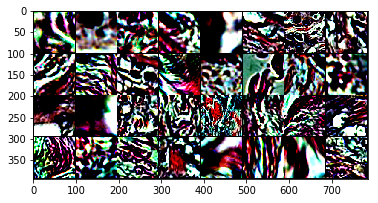

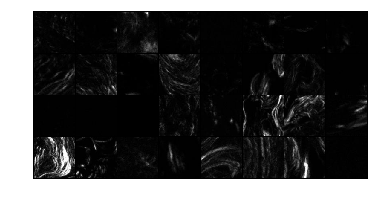

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


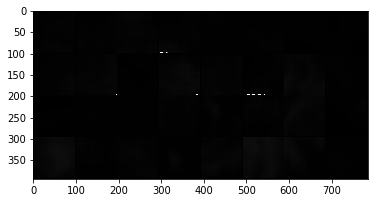

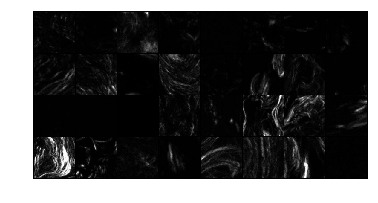

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


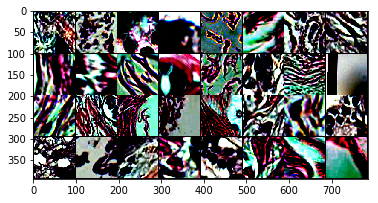

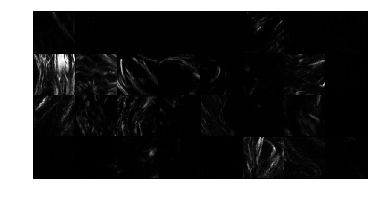

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


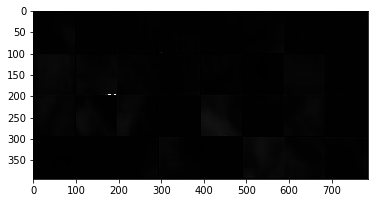

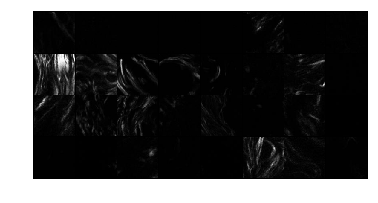

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


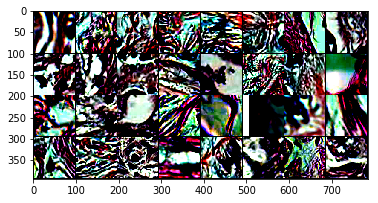

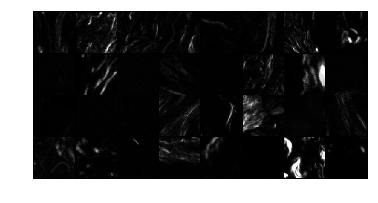

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


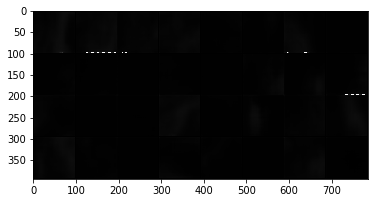

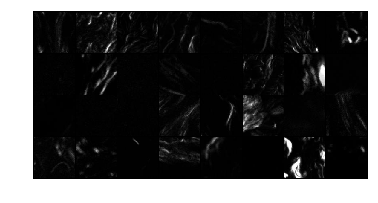

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


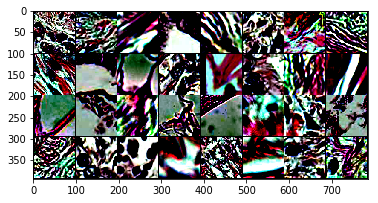

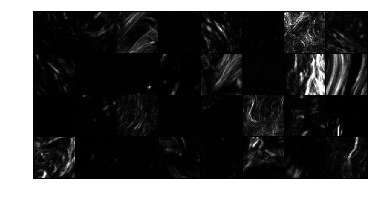

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


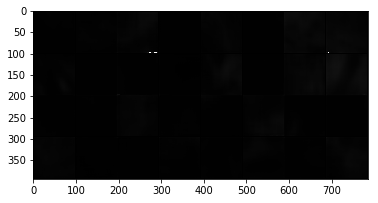

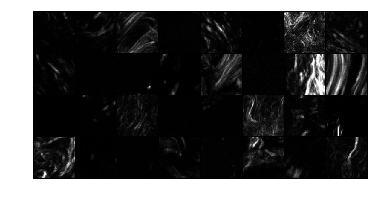

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


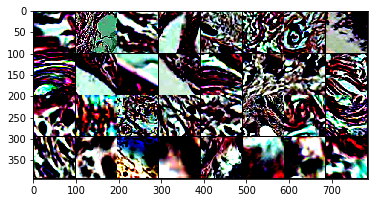

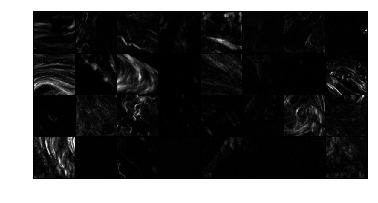

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


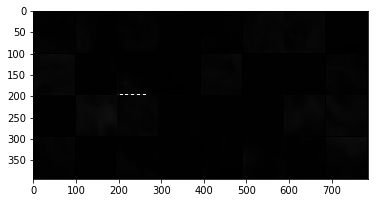

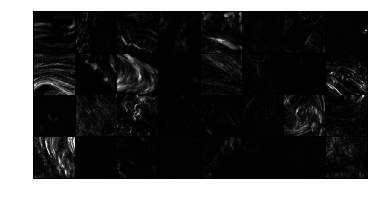

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


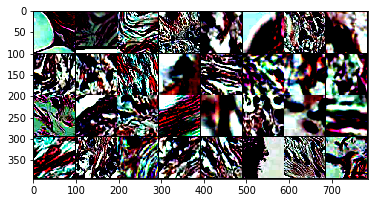

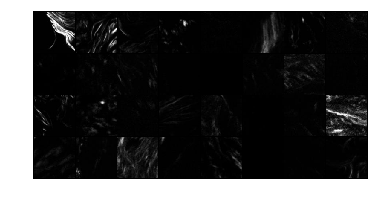

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


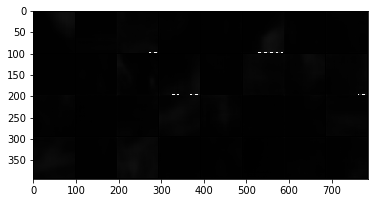

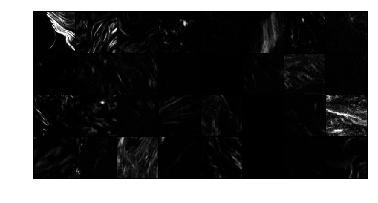

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


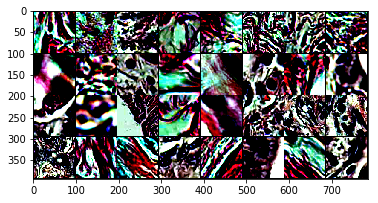

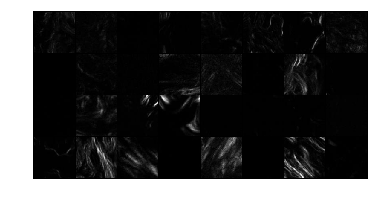

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


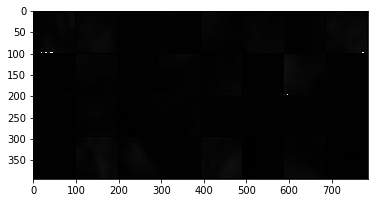

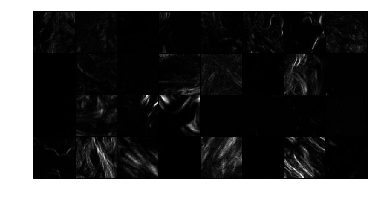

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


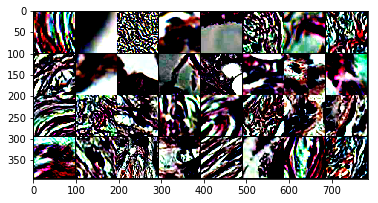

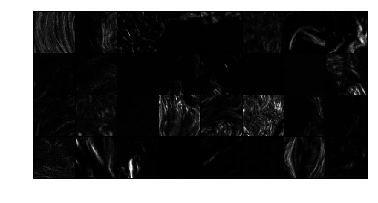

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


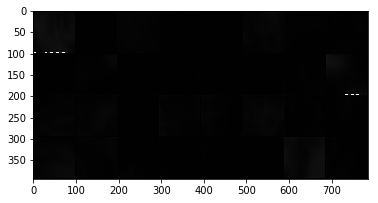

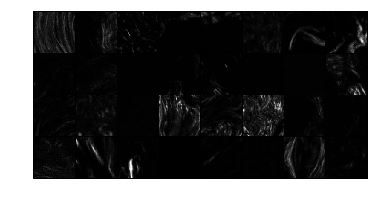

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


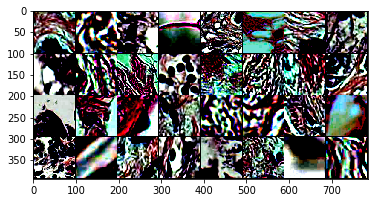

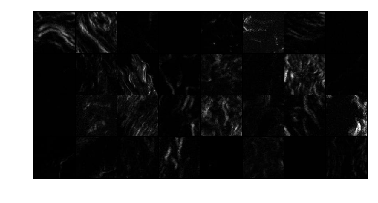

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


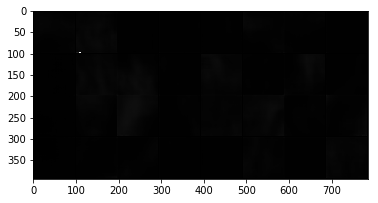

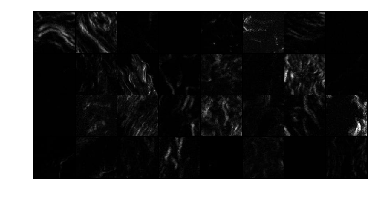

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


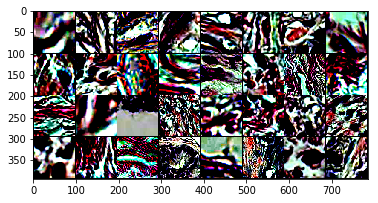

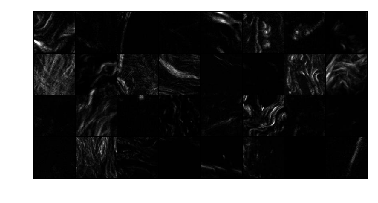

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


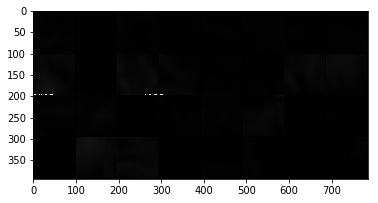

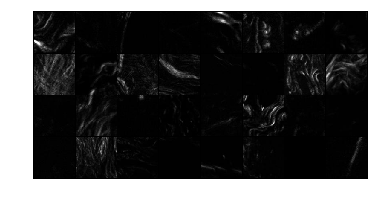

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


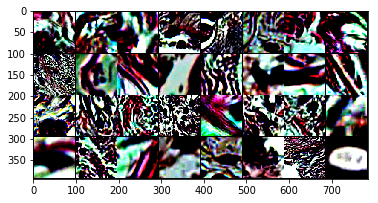

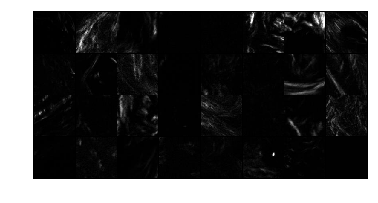

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


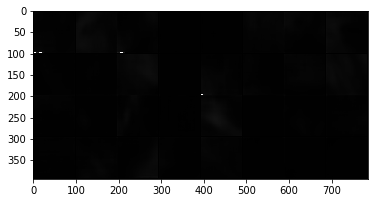

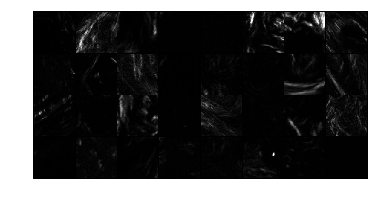

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


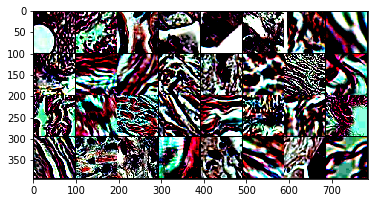

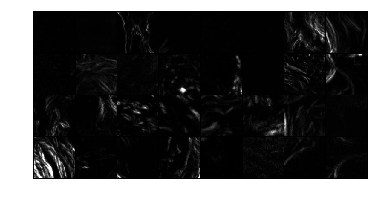

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


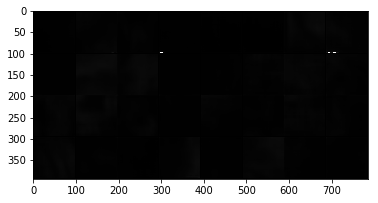

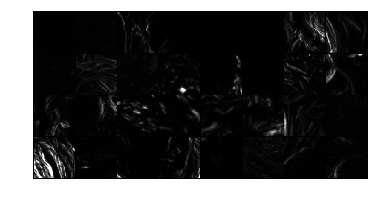

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


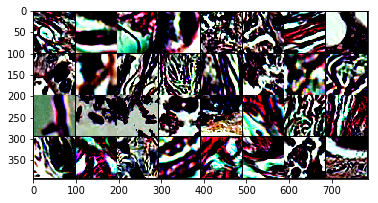

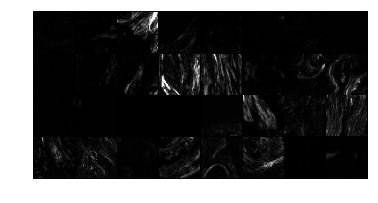

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


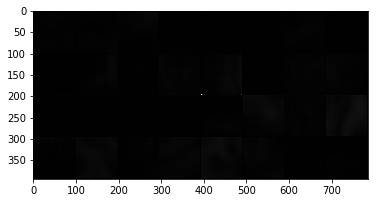

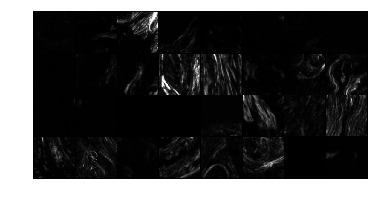

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


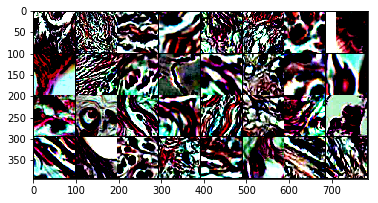

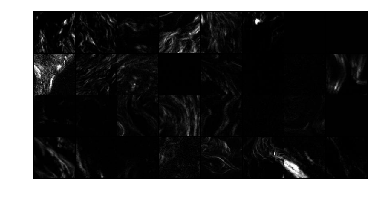

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


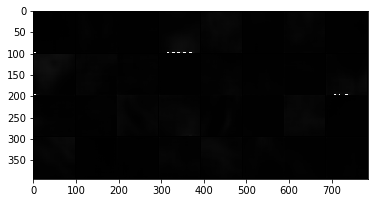

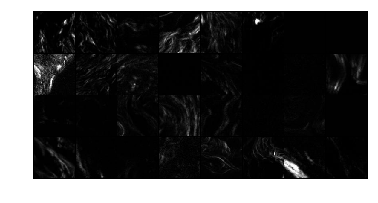

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


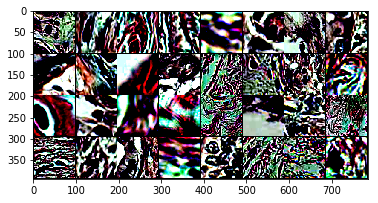

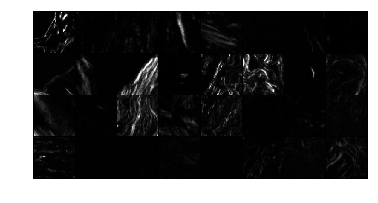

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


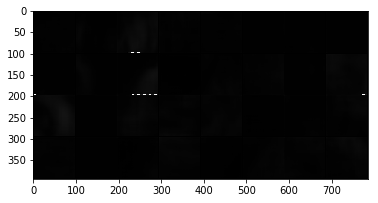

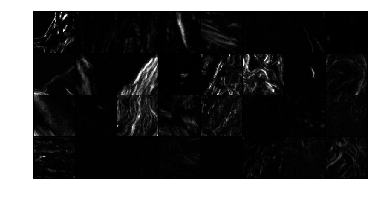

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


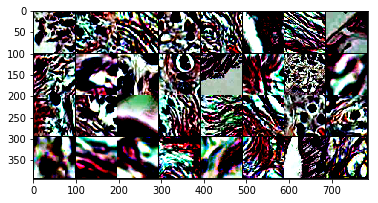

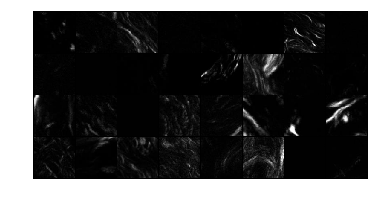

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


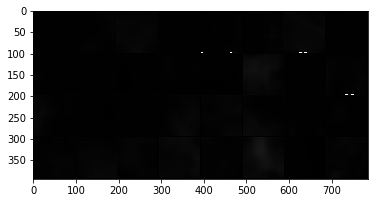

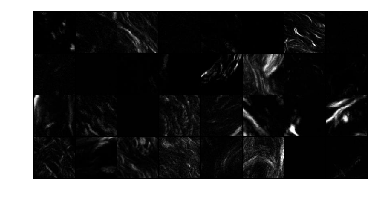

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


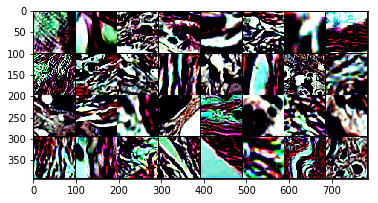

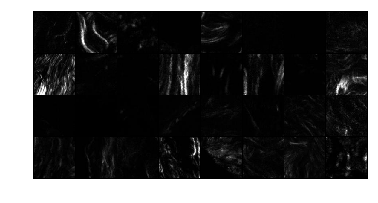

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


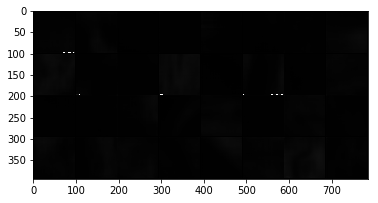

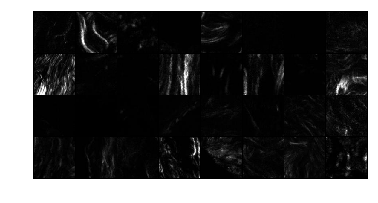

In [15]:
test()

In [11]:
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Saved model', 'encoderresinfoshuffle.pth')
torch.save(model.state_dict(), path)

In [16]:
l = 0.0001
p = 0
windowsize = 4
for epoch in range(1, 20 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*0.8
        l = l*0.2
        if windowsize == 0:
            windowsze = 1
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    train(epoch, p, windowsize)

lossMSE: 0.012731281109154224 lossSSIM: 0.3070891499519348
===> Epoch[1](0/25343): Loss: 0.3071
lossMSE: 0.010924004949629307 lossSSIM: 0.2899574041366577
===> Epoch[1](50/25343): Loss: 0.2900
lossMSE: 0.006008004304021597 lossSSIM: 0.2943084239959717
===> Epoch[1](100/25343): Loss: 0.2943
lossMSE: 0.007248261012136936 lossSSIM: 0.28383421897888184
===> Epoch[1](150/25343): Loss: 0.2838
lossMSE: 0.007700277492403984 lossSSIM: 0.3225170373916626
===> Epoch[1](200/25343): Loss: 0.3225
lossMSE: 0.007329866290092468 lossSSIM: 0.21971535682678223
===> Epoch[1](250/25343): Loss: 0.2197
lossMSE: 0.007651721592992544 lossSSIM: 0.271878719329834
===> Epoch[1](300/25343): Loss: 0.2719
lossMSE: 0.0043152919970452785 lossSSIM: 0.2144911289215088
===> Epoch[1](350/25343): Loss: 0.2145
lossMSE: 0.008684419095516205 lossSSIM: 0.21836036443710327
===> Epoch[1](400/25343): Loss: 0.2184
lossMSE: 0.006183951161801815 lossSSIM: 0.23108398914337158
===> Epoch[1](450/25343): Loss: 0.2311
lossMSE: 0.01703204

lossMSE: 0.006791810970753431 lossSSIM: 0.2445419430732727
===> Epoch[1](4150/25343): Loss: 0.2445
lossMSE: 0.004188882652670145 lossSSIM: 0.24270689487457275
===> Epoch[1](4200/25343): Loss: 0.2427
lossMSE: 0.005547746550291777 lossSSIM: 0.2674958109855652
===> Epoch[1](4250/25343): Loss: 0.2675
lossMSE: 0.0068127550184726715 lossSSIM: 0.25864458084106445
===> Epoch[1](4300/25343): Loss: 0.2586
lossMSE: 0.007626867853105068 lossSSIM: 0.29876530170440674
===> Epoch[1](4350/25343): Loss: 0.2988
lossMSE: 0.020595278590917587 lossSSIM: 0.3136265277862549
===> Epoch[1](4400/25343): Loss: 0.3136
lossMSE: 0.012922371737658978 lossSSIM: 0.31879085302352905
===> Epoch[1](4450/25343): Loss: 0.3188
lossMSE: 0.007310000713914633 lossSSIM: 0.22524124383926392
===> Epoch[1](4500/25343): Loss: 0.2252
lossMSE: 0.004092323128134012 lossSSIM: 0.23875921964645386
===> Epoch[1](4550/25343): Loss: 0.2388
lossMSE: 0.009157716296613216 lossSSIM: 0.29010647535324097
===> Epoch[1](4600/25343): Loss: 0.2901
lo

lossMSE: 0.006747545208781958 lossSSIM: 0.25873833894729614
===> Epoch[1](8300/25343): Loss: 0.2587
lossMSE: 0.003942942712455988 lossSSIM: 0.23491328954696655
===> Epoch[1](8350/25343): Loss: 0.2349
lossMSE: 0.00645804638043046 lossSSIM: 0.2597852349281311
===> Epoch[1](8400/25343): Loss: 0.2598
lossMSE: 0.008647873066365719 lossSSIM: 0.31759995222091675
===> Epoch[1](8450/25343): Loss: 0.3176
lossMSE: 0.009082835167646408 lossSSIM: 0.22681361436843872
===> Epoch[1](8500/25343): Loss: 0.2268
lossMSE: 0.0065528410486876965 lossSSIM: 0.26868152618408203
===> Epoch[1](8550/25343): Loss: 0.2687
lossMSE: 0.005150606390088797 lossSSIM: 0.24538296461105347
===> Epoch[1](8600/25343): Loss: 0.2454
lossMSE: 0.007958010770380497 lossSSIM: 0.29919546842575073
===> Epoch[1](8650/25343): Loss: 0.2992
lossMSE: 0.008251067250967026 lossSSIM: 0.23645740747451782
===> Epoch[1](8700/25343): Loss: 0.2365
lossMSE: 0.008417628705501556 lossSSIM: 0.25482815504074097
===> Epoch[1](8750/25343): Loss: 0.2548
l

lossMSE: 0.002814731327816844 lossSSIM: 0.20579278469085693
===> Epoch[1](12400/25343): Loss: 0.2058
lossMSE: 0.004423240199685097 lossSSIM: 0.2236398458480835
===> Epoch[1](12450/25343): Loss: 0.2236
lossMSE: 0.005544858984649181 lossSSIM: 0.24579095840454102
===> Epoch[1](12500/25343): Loss: 0.2458
lossMSE: 0.006765561643987894 lossSSIM: 0.2777690887451172
===> Epoch[1](12550/25343): Loss: 0.2778
lossMSE: 0.005721102934330702 lossSSIM: 0.23831522464752197
===> Epoch[1](12600/25343): Loss: 0.2383
lossMSE: 0.015872232615947723 lossSSIM: 0.2714509963989258
===> Epoch[1](12650/25343): Loss: 0.2715
lossMSE: 0.006216132082045078 lossSSIM: 0.23223930597305298
===> Epoch[1](12700/25343): Loss: 0.2322
lossMSE: 0.0058830128982663155 lossSSIM: 0.27894026041030884
===> Epoch[1](12750/25343): Loss: 0.2789
lossMSE: 0.00887481402605772 lossSSIM: 0.26855629682540894
===> Epoch[1](12800/25343): Loss: 0.2686
lossMSE: 0.006558973342180252 lossSSIM: 0.25094813108444214
===> Epoch[1](12850/25343): Loss: 

lossMSE: 0.009424213320016861 lossSSIM: 0.287003755569458
===> Epoch[1](16500/25343): Loss: 0.2870
lossMSE: 0.005051710177212954 lossSSIM: 0.2474622130393982
===> Epoch[1](16550/25343): Loss: 0.2475
lossMSE: 0.008420584723353386 lossSSIM: 0.2661750912666321
===> Epoch[1](16600/25343): Loss: 0.2662
lossMSE: 0.002542712725698948 lossSSIM: 0.22310680150985718
===> Epoch[1](16650/25343): Loss: 0.2231
lossMSE: 0.011992347426712513 lossSSIM: 0.3036808967590332
===> Epoch[1](16700/25343): Loss: 0.3037
lossMSE: 0.008509567007422447 lossSSIM: 0.2728809714317322
===> Epoch[1](16750/25343): Loss: 0.2729
lossMSE: 0.0133653674274683 lossSSIM: 0.33887189626693726
===> Epoch[1](16800/25343): Loss: 0.3389
lossMSE: 0.002738797338679433 lossSSIM: 0.23664432764053345
===> Epoch[1](16850/25343): Loss: 0.2366
lossMSE: 0.0055183107033371925 lossSSIM: 0.2691229581832886
===> Epoch[1](16900/25343): Loss: 0.2691
lossMSE: 0.005788171663880348 lossSSIM: 0.2438916563987732
===> Epoch[1](16950/25343): Loss: 0.2439

lossMSE: 0.007543799001723528 lossSSIM: 0.24895399808883667
===> Epoch[1](20600/25343): Loss: 0.2490
lossMSE: 0.005047029349952936 lossSSIM: 0.2764190435409546
===> Epoch[1](20650/25343): Loss: 0.2764
lossMSE: 0.005830451846122742 lossSSIM: 0.2901432514190674
===> Epoch[1](20700/25343): Loss: 0.2901
lossMSE: 0.009001527912914753 lossSSIM: 0.307343065738678
===> Epoch[1](20750/25343): Loss: 0.3073
lossMSE: 0.0032339536119252443 lossSSIM: 0.21801429986953735
===> Epoch[1](20800/25343): Loss: 0.2180
lossMSE: 0.009536893106997013 lossSSIM: 0.2198733687400818
===> Epoch[1](20850/25343): Loss: 0.2199
lossMSE: 0.003785076318308711 lossSSIM: 0.2263551950454712
===> Epoch[1](20900/25343): Loss: 0.2264
lossMSE: 0.0031744332518428564 lossSSIM: 0.22186124324798584
===> Epoch[1](20950/25343): Loss: 0.2219
lossMSE: 0.0037207859568297863 lossSSIM: 0.25956016778945923
===> Epoch[1](21000/25343): Loss: 0.2596
lossMSE: 0.011225181631743908 lossSSIM: 0.33746248483657837
===> Epoch[1](21050/25343): Loss: 

lossMSE: 0.005031601991504431 lossSSIM: 0.24245315790176392
===> Epoch[1](24700/25343): Loss: 0.2425
lossMSE: 0.003900676965713501 lossSSIM: 0.24509012699127197
===> Epoch[1](24750/25343): Loss: 0.2451
lossMSE: 0.006946478504687548 lossSSIM: 0.25968414545059204
===> Epoch[1](24800/25343): Loss: 0.2597
lossMSE: 0.005303193349391222 lossSSIM: 0.2484799027442932
===> Epoch[1](24850/25343): Loss: 0.2485
lossMSE: 0.005755441263318062 lossSSIM: 0.264274001121521
===> Epoch[1](24900/25343): Loss: 0.2643
lossMSE: 0.013271312229335308 lossSSIM: 0.3086166977882385
===> Epoch[1](24950/25343): Loss: 0.3086
lossMSE: 0.007505723275244236 lossSSIM: 0.2523840069770813
===> Epoch[1](25000/25343): Loss: 0.2524
lossMSE: 0.007616417482495308 lossSSIM: 0.2499677538871765
===> Epoch[1](25050/25343): Loss: 0.2500
lossMSE: 0.004665708169341087 lossSSIM: 0.23550719022750854
===> Epoch[1](25100/25343): Loss: 0.2355
lossMSE: 0.002991981338709593 lossSSIM: 0.23678356409072876
===> Epoch[1](25150/25343): Loss: 0.2

lossMSE: 0.011753545142710209 lossSSIM: 0.26289743185043335
===> Epoch[2](3500/25343): Loss: 0.2629
lossMSE: 0.007992411963641644 lossSSIM: 0.3157782554626465
===> Epoch[2](3550/25343): Loss: 0.3158
lossMSE: 0.0086322957649827 lossSSIM: 0.2955617308616638
===> Epoch[2](3600/25343): Loss: 0.2956
lossMSE: 0.008206226862967014 lossSSIM: 0.293523371219635
===> Epoch[2](3650/25343): Loss: 0.2935
lossMSE: 0.007364465855062008 lossSSIM: 0.2414044737815857
===> Epoch[2](3700/25343): Loss: 0.2414
lossMSE: 0.012595640495419502 lossSSIM: 0.32046109437942505
===> Epoch[2](3750/25343): Loss: 0.3205
lossMSE: 0.00773877976462245 lossSSIM: 0.3114132285118103
===> Epoch[2](3800/25343): Loss: 0.3114
lossMSE: 0.0021997387520968914 lossSSIM: 0.23123079538345337
===> Epoch[2](3850/25343): Loss: 0.2312
lossMSE: 0.006320709828287363 lossSSIM: 0.28743189573287964
===> Epoch[2](3900/25343): Loss: 0.2874
lossMSE: 0.005771273747086525 lossSSIM: 0.23326849937438965
===> Epoch[2](3950/25343): Loss: 0.2333
lossMSE:

lossMSE: 0.006675275508314371 lossSSIM: 0.2597624659538269
===> Epoch[2](7650/25343): Loss: 0.2598
lossMSE: 0.013980901800096035 lossSSIM: 0.3237413167953491
===> Epoch[2](7700/25343): Loss: 0.3237
lossMSE: 0.0059438603930175304 lossSSIM: 0.21609944105148315
===> Epoch[2](7750/25343): Loss: 0.2161
lossMSE: 0.004936229437589645 lossSSIM: 0.253396213054657
===> Epoch[2](7800/25343): Loss: 0.2534
lossMSE: 0.006160997319966555 lossSSIM: 0.28556889295578003
===> Epoch[2](7850/25343): Loss: 0.2856
lossMSE: 0.012188542634248734 lossSSIM: 0.2499239444732666
===> Epoch[2](7900/25343): Loss: 0.2499
lossMSE: 0.0070662531070411205 lossSSIM: 0.2624281048774719
===> Epoch[2](7950/25343): Loss: 0.2624
lossMSE: 0.013241461478173733 lossSSIM: 0.29991352558135986
===> Epoch[2](8000/25343): Loss: 0.2999
lossMSE: 0.011997271329164505 lossSSIM: 0.29417914152145386
===> Epoch[2](8050/25343): Loss: 0.2942
lossMSE: 0.00557004613801837 lossSSIM: 0.2404155135154724
===> Epoch[2](8100/25343): Loss: 0.2404
lossMS

lossMSE: 0.003946172073483467 lossSSIM: 0.24730241298675537
===> Epoch[2](11800/25343): Loss: 0.2473
lossMSE: 0.004127157386392355 lossSSIM: 0.2668718099594116
===> Epoch[2](11850/25343): Loss: 0.2669
lossMSE: 0.008588067255914211 lossSSIM: 0.2667185068130493
===> Epoch[2](11900/25343): Loss: 0.2667
lossMSE: 0.014350265264511108 lossSSIM: 0.3194933533668518
===> Epoch[2](11950/25343): Loss: 0.3195
lossMSE: 0.006834093946963549 lossSSIM: 0.3174123764038086
===> Epoch[2](12000/25343): Loss: 0.3174
lossMSE: 0.005968299228698015 lossSSIM: 0.25923067331314087
===> Epoch[2](12050/25343): Loss: 0.2592
lossMSE: 0.008283615112304688 lossSSIM: 0.32878798246383667
===> Epoch[2](12100/25343): Loss: 0.3288
lossMSE: 0.007977204397320747 lossSSIM: 0.26375579833984375
===> Epoch[2](12150/25343): Loss: 0.2638
lossMSE: 0.007023445330560207 lossSSIM: 0.28351080417633057
===> Epoch[2](12200/25343): Loss: 0.2835
lossMSE: 0.010446596890687943 lossSSIM: 0.27220678329467773
===> Epoch[2](12250/25343): Loss: 0

lossMSE: 0.003811232279986143 lossSSIM: 0.24679458141326904
===> Epoch[2](15900/25343): Loss: 0.2468
lossMSE: 0.012285849079489708 lossSSIM: 0.276736855506897
===> Epoch[2](15950/25343): Loss: 0.2767
lossMSE: 0.004054177086800337 lossSSIM: 0.24814605712890625
===> Epoch[2](16000/25343): Loss: 0.2481
lossMSE: 0.0054866354912519455 lossSSIM: 0.2403193712234497
===> Epoch[2](16050/25343): Loss: 0.2403
lossMSE: 0.012282442301511765 lossSSIM: 0.3180583715438843
===> Epoch[2](16100/25343): Loss: 0.3181
lossMSE: 0.008258309215307236 lossSSIM: 0.24551600217819214
===> Epoch[2](16150/25343): Loss: 0.2455
lossMSE: 0.00963535811752081 lossSSIM: 0.3186032772064209
===> Epoch[2](16200/25343): Loss: 0.3186
lossMSE: 0.005879039876163006 lossSSIM: 0.2936214804649353
===> Epoch[2](16250/25343): Loss: 0.2936
lossMSE: 0.005573203321546316 lossSSIM: 0.22150170803070068
===> Epoch[2](16300/25343): Loss: 0.2215
lossMSE: 0.0032767453230917454 lossSSIM: 0.20897972583770752
===> Epoch[2](16350/25343): Loss: 0.

lossMSE: 0.005392497405409813 lossSSIM: 0.24670195579528809
===> Epoch[2](20000/25343): Loss: 0.2467
lossMSE: 0.005365528166294098 lossSSIM: 0.2670387625694275
===> Epoch[2](20050/25343): Loss: 0.2670
lossMSE: 0.006209576036781073 lossSSIM: 0.24858874082565308
===> Epoch[2](20100/25343): Loss: 0.2486
lossMSE: 0.007608466781675816 lossSSIM: 0.24550485610961914
===> Epoch[2](20150/25343): Loss: 0.2455
lossMSE: 0.007052858825773001 lossSSIM: 0.25308847427368164
===> Epoch[2](20200/25343): Loss: 0.2531
lossMSE: 0.004320752341300249 lossSSIM: 0.21766293048858643
===> Epoch[2](20250/25343): Loss: 0.2177
lossMSE: 0.009778850711882114 lossSSIM: 0.3008382320404053
===> Epoch[2](20300/25343): Loss: 0.3008
lossMSE: 0.014065580442547798 lossSSIM: 0.2922285199165344
===> Epoch[2](20350/25343): Loss: 0.2922
lossMSE: 0.004307701252400875 lossSSIM: 0.24161779880523682
===> Epoch[2](20400/25343): Loss: 0.2416
lossMSE: 0.009695306420326233 lossSSIM: 0.271517276763916
===> Epoch[2](20450/25343): Loss: 0.

lossMSE: 0.004373905714601278 lossSSIM: 0.17733806371688843
===> Epoch[2](24100/25343): Loss: 0.1773
lossMSE: 0.0057725366204977036 lossSSIM: 0.26993876695632935
===> Epoch[2](24150/25343): Loss: 0.2699
lossMSE: 0.00814809463918209 lossSSIM: 0.267869770526886
===> Epoch[2](24200/25343): Loss: 0.2679
lossMSE: 0.008112292736768723 lossSSIM: 0.26430296897888184
===> Epoch[2](24250/25343): Loss: 0.2643
lossMSE: 0.002175302244722843 lossSSIM: 0.24299907684326172
===> Epoch[2](24300/25343): Loss: 0.2430
lossMSE: 0.004508869256824255 lossSSIM: 0.21066021919250488
===> Epoch[2](24350/25343): Loss: 0.2107
lossMSE: 0.003229832509532571 lossSSIM: 0.21847492456436157
===> Epoch[2](24400/25343): Loss: 0.2185
lossMSE: 0.009757058694958687 lossSSIM: 0.32249462604522705
===> Epoch[2](24450/25343): Loss: 0.3225
lossMSE: 0.003645219374448061 lossSSIM: 0.2438526153564453
===> Epoch[2](24500/25343): Loss: 0.2439
lossMSE: 0.004934406373649836 lossSSIM: 0.2724899649620056
===> Epoch[2](24550/25343): Loss: 0

lossMSE: 0.007703052833676338 lossSSIM: 0.25826525688171387
===> Epoch[3](2850/25343): Loss: 0.2583
lossMSE: 0.012087836861610413 lossSSIM: 0.2736091613769531
===> Epoch[3](2900/25343): Loss: 0.2736
lossMSE: 0.010395703837275505 lossSSIM: 0.3237054944038391
===> Epoch[3](2950/25343): Loss: 0.3237
lossMSE: 0.008113902993500233 lossSSIM: 0.2815479636192322
===> Epoch[3](3000/25343): Loss: 0.2815
lossMSE: 0.004666422493755817 lossSSIM: 0.258833646774292
===> Epoch[3](3050/25343): Loss: 0.2588
lossMSE: 0.007645461242645979 lossSSIM: 0.2874346971511841
===> Epoch[3](3100/25343): Loss: 0.2874
lossMSE: 0.006809542421251535 lossSSIM: 0.27187615633010864
===> Epoch[3](3150/25343): Loss: 0.2719
lossMSE: 0.006437067873775959 lossSSIM: 0.276614785194397
===> Epoch[3](3200/25343): Loss: 0.2766
lossMSE: 0.007490876596421003 lossSSIM: 0.28875869512557983
===> Epoch[3](3250/25343): Loss: 0.2888
lossMSE: 0.008171540684998035 lossSSIM: 0.2720078229904175
===> Epoch[3](3300/25343): Loss: 0.2720
lossMSE: 

lossMSE: 0.006746368948370218 lossSSIM: 0.2817039489746094
===> Epoch[3](7000/25343): Loss: 0.2817
lossMSE: 0.012637166306376457 lossSSIM: 0.3015093207359314
===> Epoch[3](7050/25343): Loss: 0.3015
lossMSE: 0.009028460830450058 lossSSIM: 0.2428310513496399
===> Epoch[3](7100/25343): Loss: 0.2428
lossMSE: 0.0054470389150083065 lossSSIM: 0.24395394325256348
===> Epoch[3](7150/25343): Loss: 0.2440
lossMSE: 0.0020484114065766335 lossSSIM: 0.23018485307693481
===> Epoch[3](7200/25343): Loss: 0.2302
lossMSE: 0.010430160909891129 lossSSIM: 0.2671728730201721
===> Epoch[3](7250/25343): Loss: 0.2672
lossMSE: 0.009438056498765945 lossSSIM: 0.2709149718284607
===> Epoch[3](7300/25343): Loss: 0.2709
lossMSE: 0.0033788804430514574 lossSSIM: 0.2425287961959839
===> Epoch[3](7350/25343): Loss: 0.2425
lossMSE: 0.007693926338106394 lossSSIM: 0.2949128746986389
===> Epoch[3](7400/25343): Loss: 0.2949
lossMSE: 0.0037886863574385643 lossSSIM: 0.1976996660232544
===> Epoch[3](7450/25343): Loss: 0.1977
loss

lossMSE: 0.005612654611468315 lossSSIM: 0.268962562084198
===> Epoch[3](11150/25343): Loss: 0.2690
lossMSE: 0.009047429077327251 lossSSIM: 0.2600223422050476
===> Epoch[3](11200/25343): Loss: 0.2600
lossMSE: 0.003196501173079014 lossSSIM: 0.2356838583946228
===> Epoch[3](11250/25343): Loss: 0.2357
lossMSE: 0.00665096752345562 lossSSIM: 0.2408219575881958
===> Epoch[3](11300/25343): Loss: 0.2408
lossMSE: 0.004854519851505756 lossSSIM: 0.24974262714385986
===> Epoch[3](11350/25343): Loss: 0.2497
lossMSE: 0.005090666934847832 lossSSIM: 0.2525154948234558
===> Epoch[3](11400/25343): Loss: 0.2525
lossMSE: 0.006970039568841457 lossSSIM: 0.24913126230239868
===> Epoch[3](11450/25343): Loss: 0.2491
lossMSE: 0.003097045235335827 lossSSIM: 0.2117038369178772
===> Epoch[3](11500/25343): Loss: 0.2117
lossMSE: 0.006181466858834028 lossSSIM: 0.23005586862564087
===> Epoch[3](11550/25343): Loss: 0.2301
lossMSE: 0.008044617250561714 lossSSIM: 0.243194580078125
===> Epoch[3](11600/25343): Loss: 0.2432


lossMSE: 0.005660177208483219 lossSSIM: 0.22452735900878906
===> Epoch[3](15250/25343): Loss: 0.2245
lossMSE: 0.014109492301940918 lossSSIM: 0.3014122247695923
===> Epoch[3](15300/25343): Loss: 0.3014
lossMSE: 0.002921727718785405 lossSSIM: 0.20024770498275757
===> Epoch[3](15350/25343): Loss: 0.2002
lossMSE: 0.016082612797617912 lossSSIM: 0.3370121121406555
===> Epoch[3](15400/25343): Loss: 0.3370
lossMSE: 0.009137398563325405 lossSSIM: 0.26462310552597046
===> Epoch[3](15450/25343): Loss: 0.2646
lossMSE: 0.008290709927678108 lossSSIM: 0.22610002756118774
===> Epoch[3](15500/25343): Loss: 0.2261
lossMSE: 0.005962037947028875 lossSSIM: 0.28617119789123535
===> Epoch[3](15550/25343): Loss: 0.2862
lossMSE: 0.00861672218888998 lossSSIM: 0.2735081911087036
===> Epoch[3](15600/25343): Loss: 0.2735
lossMSE: 0.0088577289134264 lossSSIM: 0.2765849828720093
===> Epoch[3](15650/25343): Loss: 0.2766
lossMSE: 0.003385160118341446 lossSSIM: 0.24149608612060547
===> Epoch[3](15700/25343): Loss: 0.24

lossMSE: 0.006497508846223354 lossSSIM: 0.2607761025428772
===> Epoch[3](19350/25343): Loss: 0.2608
lossMSE: 0.002825025701895356 lossSSIM: 0.24593937397003174
===> Epoch[3](19400/25343): Loss: 0.2459
lossMSE: 0.00506599759683013 lossSSIM: 0.2847214341163635
===> Epoch[3](19450/25343): Loss: 0.2847
lossMSE: 0.007029988802969456 lossSSIM: 0.21063005924224854
===> Epoch[3](19500/25343): Loss: 0.2106
lossMSE: 0.004767047706991434 lossSSIM: 0.2717441916465759
===> Epoch[3](19550/25343): Loss: 0.2717
lossMSE: 0.003941748756915331 lossSSIM: 0.20194917917251587
===> Epoch[3](19600/25343): Loss: 0.2019
lossMSE: 0.0026451055891811848 lossSSIM: 0.19663065671920776
===> Epoch[3](19650/25343): Loss: 0.1966
lossMSE: 0.003912827931344509 lossSSIM: 0.21682250499725342
===> Epoch[3](19700/25343): Loss: 0.2168
lossMSE: 0.005399001762270927 lossSSIM: 0.2733193635940552
===> Epoch[3](19750/25343): Loss: 0.2733
lossMSE: 0.0068323370069265366 lossSSIM: 0.2694568634033203
===> Epoch[3](19800/25343): Loss: 0

lossMSE: 0.006932644639164209 lossSSIM: 0.30056703090667725
===> Epoch[3](23450/25343): Loss: 0.3006
lossMSE: 0.010769347660243511 lossSSIM: 0.27892690896987915
===> Epoch[3](23500/25343): Loss: 0.2789
lossMSE: 0.0033586211502552032 lossSSIM: 0.22002965211868286
===> Epoch[3](23550/25343): Loss: 0.2200
lossMSE: 0.0038188998587429523 lossSSIM: 0.24453788995742798
===> Epoch[3](23600/25343): Loss: 0.2445
lossMSE: 0.0076170689426362514 lossSSIM: 0.2962687611579895
===> Epoch[3](23650/25343): Loss: 0.2963
lossMSE: 0.0038994597271084785 lossSSIM: 0.23631268739700317
===> Epoch[3](23700/25343): Loss: 0.2363
lossMSE: 0.008647660724818707 lossSSIM: 0.25278496742248535
===> Epoch[3](23750/25343): Loss: 0.2528
lossMSE: 0.004979331977665424 lossSSIM: 0.2810431122779846
===> Epoch[3](23800/25343): Loss: 0.2810
lossMSE: 0.007232106290757656 lossSSIM: 0.2699087858200073
===> Epoch[3](23850/25343): Loss: 0.2699
lossMSE: 0.0051417239010334015 lossSSIM: 0.2570335268974304
===> Epoch[3](23900/25343): Lo

lossMSE: 0.006236579734832048 lossSSIM: 0.2685199975967407
===> Epoch[4](2200/25343): Loss: 0.2685
lossMSE: 0.006617335136979818 lossSSIM: 0.2803789973258972
===> Epoch[4](2250/25343): Loss: 0.2804
lossMSE: 0.008062435314059258 lossSSIM: 0.31372374296188354
===> Epoch[4](2300/25343): Loss: 0.3137
lossMSE: 0.00802635122090578 lossSSIM: 0.27230262756347656
===> Epoch[4](2350/25343): Loss: 0.2723
lossMSE: 0.0051424261182546616 lossSSIM: 0.20333606004714966
===> Epoch[4](2400/25343): Loss: 0.2033
lossMSE: 0.006638068240135908 lossSSIM: 0.20315122604370117
===> Epoch[4](2450/25343): Loss: 0.2032
lossMSE: 0.0033820064272731543 lossSSIM: 0.20890885591506958
===> Epoch[4](2500/25343): Loss: 0.2089
lossMSE: 0.00699725653976202 lossSSIM: 0.2803120017051697
===> Epoch[4](2550/25343): Loss: 0.2803
lossMSE: 0.005589545704424381 lossSSIM: 0.2270856499671936
===> Epoch[4](2600/25343): Loss: 0.2271
lossMSE: 0.006055199541151524 lossSSIM: 0.20247411727905273
===> Epoch[4](2650/25343): Loss: 0.2025
loss

lossMSE: 0.006100191734731197 lossSSIM: 0.2751994729042053
===> Epoch[4](6350/25343): Loss: 0.2752
lossMSE: 0.003747084178030491 lossSSIM: 0.2566312551498413
===> Epoch[4](6400/25343): Loss: 0.2566
lossMSE: 0.00870999414473772 lossSSIM: 0.22697913646697998
===> Epoch[4](6450/25343): Loss: 0.2270
lossMSE: 0.0033558052964508533 lossSSIM: 0.25777316093444824
===> Epoch[4](6500/25343): Loss: 0.2578
lossMSE: 0.0063155521638691425 lossSSIM: 0.24708300828933716
===> Epoch[4](6550/25343): Loss: 0.2471
lossMSE: 0.010855368338525295 lossSSIM: 0.3252037763595581
===> Epoch[4](6600/25343): Loss: 0.3252
lossMSE: 0.010902141220867634 lossSSIM: 0.30442994832992554
===> Epoch[4](6650/25343): Loss: 0.3044
lossMSE: 0.005095595959573984 lossSSIM: 0.24848932027816772
===> Epoch[4](6700/25343): Loss: 0.2485
lossMSE: 0.01099814847111702 lossSSIM: 0.3126600384712219
===> Epoch[4](6750/25343): Loss: 0.3127
lossMSE: 0.005583110731095076 lossSSIM: 0.2328282594680786
===> Epoch[4](6800/25343): Loss: 0.2328
lossM

lossMSE: 0.009131676517426968 lossSSIM: 0.2894759774208069
===> Epoch[4](10500/25343): Loss: 0.2895
lossMSE: 0.010753932408988476 lossSSIM: 0.33739233016967773
===> Epoch[4](10550/25343): Loss: 0.3374
lossMSE: 0.006891651079058647 lossSSIM: 0.27572184801101685
===> Epoch[4](10600/25343): Loss: 0.2757
lossMSE: 0.0027151843532919884 lossSSIM: 0.20714563131332397
===> Epoch[4](10650/25343): Loss: 0.2071
lossMSE: 0.006862543057650328 lossSSIM: 0.2699699401855469
===> Epoch[4](10700/25343): Loss: 0.2700
lossMSE: 0.006423326674848795 lossSSIM: 0.26319730281829834
===> Epoch[4](10750/25343): Loss: 0.2632
lossMSE: 0.007789602503180504 lossSSIM: 0.25688713788986206
===> Epoch[4](10800/25343): Loss: 0.2569
lossMSE: 0.008057738654315472 lossSSIM: 0.2662684917449951
===> Epoch[4](10850/25343): Loss: 0.2663
lossMSE: 0.0040674228221178055 lossSSIM: 0.2582452893257141
===> Epoch[4](10900/25343): Loss: 0.2582
lossMSE: 0.009084908291697502 lossSSIM: 0.2309499979019165
===> Epoch[4](10950/25343): Loss: 

lossMSE: 0.00342412362806499 lossSSIM: 0.22053462266921997
===> Epoch[4](14600/25343): Loss: 0.2205
lossMSE: 0.005488211289048195 lossSSIM: 0.2484959363937378
===> Epoch[4](14650/25343): Loss: 0.2485
lossMSE: 0.0081501929089427 lossSSIM: 0.24363404512405396
===> Epoch[4](14700/25343): Loss: 0.2436
lossMSE: 0.00937521830201149 lossSSIM: 0.25370144844055176
===> Epoch[4](14750/25343): Loss: 0.2537
lossMSE: 0.0053917476907372475 lossSSIM: 0.28716981410980225
===> Epoch[4](14800/25343): Loss: 0.2872
lossMSE: 0.0021477604750543833 lossSSIM: 0.20438116788864136
===> Epoch[4](14850/25343): Loss: 0.2044
lossMSE: 0.002292468911036849 lossSSIM: 0.18185174465179443
===> Epoch[4](14900/25343): Loss: 0.1819
lossMSE: 0.009689254686236382 lossSSIM: 0.21976995468139648
===> Epoch[4](14950/25343): Loss: 0.2198
lossMSE: 0.008392559364438057 lossSSIM: 0.3161255121231079
===> Epoch[4](15000/25343): Loss: 0.3161
lossMSE: 0.007926532998681068 lossSSIM: 0.2479735016822815
===> Epoch[4](15050/25343): Loss: 0.

lossMSE: 0.0061235325410962105 lossSSIM: 0.2355453372001648
===> Epoch[4](18700/25343): Loss: 0.2355
lossMSE: 0.004829188343137503 lossSSIM: 0.26688897609710693
===> Epoch[4](18750/25343): Loss: 0.2669
lossMSE: 0.006485539488494396 lossSSIM: 0.28137725591659546
===> Epoch[4](18800/25343): Loss: 0.2814
lossMSE: 0.005039902403950691 lossSSIM: 0.24339258670806885
===> Epoch[4](18850/25343): Loss: 0.2434
lossMSE: 0.007727248594164848 lossSSIM: 0.2770382761955261
===> Epoch[4](18900/25343): Loss: 0.2770
lossMSE: 0.002999385818839073 lossSSIM: 0.2543119192123413
===> Epoch[4](18950/25343): Loss: 0.2543
lossMSE: 0.011073720641434193 lossSSIM: 0.3087844252586365
===> Epoch[4](19000/25343): Loss: 0.3088
lossMSE: 0.006685768719762564 lossSSIM: 0.2654449939727783
===> Epoch[4](19050/25343): Loss: 0.2654
lossMSE: 0.013820641674101353 lossSSIM: 0.3063286542892456
===> Epoch[4](19100/25343): Loss: 0.3063
lossMSE: 0.010108464397490025 lossSSIM: 0.2921566367149353
===> Epoch[4](19150/25343): Loss: 0.2

lossMSE: 0.010930271819233894 lossSSIM: 0.2868300676345825
===> Epoch[4](22800/25343): Loss: 0.2868
lossMSE: 0.0066414098255336285 lossSSIM: 0.28041666746139526
===> Epoch[4](22850/25343): Loss: 0.2804
lossMSE: 0.005464982707053423 lossSSIM: 0.27958571910858154
===> Epoch[4](22900/25343): Loss: 0.2796
lossMSE: 0.008746204897761345 lossSSIM: 0.3190772533416748
===> Epoch[4](22950/25343): Loss: 0.3191
lossMSE: 0.004725153092294931 lossSSIM: 0.24168384075164795
===> Epoch[4](23000/25343): Loss: 0.2417
lossMSE: 0.0037827501073479652 lossSSIM: 0.26697206497192383
===> Epoch[4](23050/25343): Loss: 0.2670
lossMSE: 0.008205149322748184 lossSSIM: 0.25813716650009155
===> Epoch[4](23100/25343): Loss: 0.2581
lossMSE: 0.004613029304891825 lossSSIM: 0.22735726833343506
===> Epoch[4](23150/25343): Loss: 0.2274
lossMSE: 0.00565543957054615 lossSSIM: 0.2284744381904602
===> Epoch[4](23200/25343): Loss: 0.2285
lossMSE: 0.010296647436916828 lossSSIM: 0.26220643520355225
===> Epoch[4](23250/25343): Loss:

lossMSE: 0.0065543195232748985 lossSSIM: 0.2991001009941101
===> Epoch[5](1550/25343): Loss: 0.2991
lossMSE: 0.005719602108001709 lossSSIM: 0.22512900829315186
===> Epoch[5](1600/25343): Loss: 0.2251
lossMSE: 0.008767466992139816 lossSSIM: 0.2539673447608948
===> Epoch[5](1650/25343): Loss: 0.2540
lossMSE: 0.0021410887129604816 lossSSIM: 0.2046356201171875
===> Epoch[5](1700/25343): Loss: 0.2046
lossMSE: 0.004646078683435917 lossSSIM: 0.26003700494766235
===> Epoch[5](1750/25343): Loss: 0.2600
lossMSE: 0.004385907202959061 lossSSIM: 0.2297443151473999
===> Epoch[5](1800/25343): Loss: 0.2297
lossMSE: 0.013225432485342026 lossSSIM: 0.35268378257751465
===> Epoch[5](1850/25343): Loss: 0.3527
lossMSE: 0.01884468086063862 lossSSIM: 0.31951189041137695
===> Epoch[5](1900/25343): Loss: 0.3195
lossMSE: 0.005937976762652397 lossSSIM: 0.27919071912765503
===> Epoch[5](1950/25343): Loss: 0.2792
lossMSE: 0.004591392818838358 lossSSIM: 0.26279622316360474
===> Epoch[5](2000/25343): Loss: 0.2628
los

lossMSE: 0.0069936299696564674 lossSSIM: 0.2687212824821472
===> Epoch[5](5700/25343): Loss: 0.2687
lossMSE: 0.0046086846850812435 lossSSIM: 0.19691771268844604
===> Epoch[5](5750/25343): Loss: 0.1969
lossMSE: 0.008951909840106964 lossSSIM: 0.2747013568878174
===> Epoch[5](5800/25343): Loss: 0.2747
lossMSE: 0.005021723452955484 lossSSIM: 0.2591709494590759
===> Epoch[5](5850/25343): Loss: 0.2592
lossMSE: 0.003837485797703266 lossSSIM: 0.22397446632385254
===> Epoch[5](5900/25343): Loss: 0.2240
lossMSE: 0.007728397846221924 lossSSIM: 0.26198363304138184
===> Epoch[5](5950/25343): Loss: 0.2620
lossMSE: 0.004540977533906698 lossSSIM: 0.2205837368965149
===> Epoch[5](6000/25343): Loss: 0.2206
lossMSE: 0.007390333339571953 lossSSIM: 0.26360201835632324
===> Epoch[5](6050/25343): Loss: 0.2636
lossMSE: 0.005823772866278887 lossSSIM: 0.24836301803588867
===> Epoch[5](6100/25343): Loss: 0.2484
lossMSE: 0.0045175980776548386 lossSSIM: 0.2589663863182068
===> Epoch[5](6150/25343): Loss: 0.2590
lo

lossMSE: 0.003730759024620056 lossSSIM: 0.2145479917526245
===> Epoch[5](9850/25343): Loss: 0.2145
lossMSE: 0.009815627709031105 lossSSIM: 0.2664468288421631
===> Epoch[5](9900/25343): Loss: 0.2664
lossMSE: 0.003082847688347101 lossSSIM: 0.2731836438179016
===> Epoch[5](9950/25343): Loss: 0.2732
lossMSE: 0.003944504074752331 lossSSIM: 0.23966890573501587
===> Epoch[5](10000/25343): Loss: 0.2397
lossMSE: 0.0036396218929439783 lossSSIM: 0.21929442882537842
===> Epoch[5](10050/25343): Loss: 0.2193
lossMSE: 0.005441111978143454 lossSSIM: 0.2733858823776245
===> Epoch[5](10100/25343): Loss: 0.2734
lossMSE: 0.008706944063305855 lossSSIM: 0.3319646120071411
===> Epoch[5](10150/25343): Loss: 0.3320
lossMSE: 0.00529490364715457 lossSSIM: 0.24320238828659058
===> Epoch[5](10200/25343): Loss: 0.2432
lossMSE: 0.003946094308048487 lossSSIM: 0.2551919221878052
===> Epoch[5](10250/25343): Loss: 0.2552
lossMSE: 0.004465763922780752 lossSSIM: 0.23466718196868896
===> Epoch[5](10300/25343): Loss: 0.2347

lossMSE: 0.0033142203465104103 lossSSIM: 0.2574477791786194
===> Epoch[5](13950/25343): Loss: 0.2574
lossMSE: 0.009225777350366116 lossSSIM: 0.28748440742492676
===> Epoch[5](14000/25343): Loss: 0.2875
lossMSE: 0.016099004074931145 lossSSIM: 0.31830066442489624
===> Epoch[5](14050/25343): Loss: 0.3183
lossMSE: 0.012537715025246143 lossSSIM: 0.2799959182739258
===> Epoch[5](14100/25343): Loss: 0.2800
lossMSE: 0.004833168350160122 lossSSIM: 0.22667944431304932
===> Epoch[5](14150/25343): Loss: 0.2267
lossMSE: 0.0035340534523129463 lossSSIM: 0.19201958179473877
===> Epoch[5](14200/25343): Loss: 0.1920
lossMSE: 0.009184160269796848 lossSSIM: 0.2865478992462158
===> Epoch[5](14250/25343): Loss: 0.2865
lossMSE: 0.006854915991425514 lossSSIM: 0.2902402877807617
===> Epoch[5](14300/25343): Loss: 0.2902
lossMSE: 0.00957562681287527 lossSSIM: 0.2862269878387451
===> Epoch[5](14350/25343): Loss: 0.2862
lossMSE: 0.004444239195436239 lossSSIM: 0.25239109992980957
===> Epoch[5](14400/25343): Loss: 0

lossMSE: 0.00874285027384758 lossSSIM: 0.2750764489173889
===> Epoch[5](18050/25343): Loss: 0.2751
lossMSE: 0.010954776778817177 lossSSIM: 0.2719283699989319
===> Epoch[5](18100/25343): Loss: 0.2719
lossMSE: 0.00938863679766655 lossSSIM: 0.24373817443847656
===> Epoch[5](18150/25343): Loss: 0.2437
lossMSE: 0.007805821020156145 lossSSIM: 0.27843767404556274
===> Epoch[5](18200/25343): Loss: 0.2784
lossMSE: 0.003028589766472578 lossSSIM: 0.21401047706604004
===> Epoch[5](18250/25343): Loss: 0.2140
lossMSE: 0.004117811564356089 lossSSIM: 0.21441972255706787
===> Epoch[5](18300/25343): Loss: 0.2144
lossMSE: 0.0031272086780518293 lossSSIM: 0.20684856176376343
===> Epoch[5](18350/25343): Loss: 0.2068
lossMSE: 0.010479669086635113 lossSSIM: 0.27874040603637695
===> Epoch[5](18400/25343): Loss: 0.2787
lossMSE: 0.007749008480459452 lossSSIM: 0.27642822265625
===> Epoch[5](18450/25343): Loss: 0.2764
lossMSE: 0.00539929186925292 lossSSIM: 0.18532562255859375
===> Epoch[5](18500/25343): Loss: 0.18

lossMSE: 0.013241799548268318 lossSSIM: 0.2931482791900635
===> Epoch[5](22150/25343): Loss: 0.2931
lossMSE: 0.0062612020410597324 lossSSIM: 0.258304238319397
===> Epoch[5](22200/25343): Loss: 0.2583
lossMSE: 0.01934060826897621 lossSSIM: 0.2923588752746582
===> Epoch[5](22250/25343): Loss: 0.2924
lossMSE: 0.006227400619536638 lossSSIM: 0.26369935274124146
===> Epoch[5](22300/25343): Loss: 0.2637
lossMSE: 0.005240586120635271 lossSSIM: 0.21138811111450195
===> Epoch[5](22350/25343): Loss: 0.2114
lossMSE: 0.008290424942970276 lossSSIM: 0.29789745807647705
===> Epoch[5](22400/25343): Loss: 0.2979
lossMSE: 0.014829857274889946 lossSSIM: 0.33987927436828613
===> Epoch[5](22450/25343): Loss: 0.3399
lossMSE: 0.011748402379453182 lossSSIM: 0.2847129702568054
===> Epoch[5](22500/25343): Loss: 0.2847
lossMSE: 0.007956943474709988 lossSSIM: 0.2247147560119629
===> Epoch[5](22550/25343): Loss: 0.2247
lossMSE: 0.005389726255089045 lossSSIM: 0.29137176275253296
===> Epoch[5](22600/25343): Loss: 0.2

lossMSE: 0.007375482004135847 lossSSIM: 0.2839789390563965
===> Epoch[6](900/25343): Loss: 0.2840
lossMSE: 0.014533773064613342 lossSSIM: 0.3073115944862366
===> Epoch[6](950/25343): Loss: 0.3073
lossMSE: 0.00753327552229166 lossSSIM: 0.3000810146331787
===> Epoch[6](1000/25343): Loss: 0.3001
lossMSE: 0.005704566836357117 lossSSIM: 0.2920989990234375
===> Epoch[6](1050/25343): Loss: 0.2921
lossMSE: 0.005267476662993431 lossSSIM: 0.24293386936187744
===> Epoch[6](1100/25343): Loss: 0.2429
lossMSE: 0.006192652974277735 lossSSIM: 0.2344503402709961
===> Epoch[6](1150/25343): Loss: 0.2345
lossMSE: 0.009718488901853561 lossSSIM: 0.28249090909957886
===> Epoch[6](1200/25343): Loss: 0.2825
lossMSE: 0.010534600354731083 lossSSIM: 0.2780287265777588
===> Epoch[6](1250/25343): Loss: 0.2780
lossMSE: 0.01238813903182745 lossSSIM: 0.3117550015449524
===> Epoch[6](1300/25343): Loss: 0.3118
lossMSE: 0.0064286901615560055 lossSSIM: 0.2954908013343811
===> Epoch[6](1350/25343): Loss: 0.2955
lossMSE: 0.

lossMSE: 0.009935785084962845 lossSSIM: 0.2539570927619934
===> Epoch[6](5050/25343): Loss: 0.2540
lossMSE: 0.022321471944451332 lossSSIM: 0.37889111042022705
===> Epoch[6](5100/25343): Loss: 0.3789
lossMSE: 0.009512905031442642 lossSSIM: 0.29553765058517456
===> Epoch[6](5150/25343): Loss: 0.2955
lossMSE: 0.010124165564775467 lossSSIM: 0.32555627822875977
===> Epoch[6](5200/25343): Loss: 0.3256
lossMSE: 0.008003809489309788 lossSSIM: 0.30675357580184937
===> Epoch[6](5250/25343): Loss: 0.3068
lossMSE: 0.0025787956546992064 lossSSIM: 0.21899181604385376
===> Epoch[6](5300/25343): Loss: 0.2190
lossMSE: 0.007527791894972324 lossSSIM: 0.2807716727256775
===> Epoch[6](5350/25343): Loss: 0.2808
lossMSE: 0.010545561090111732 lossSSIM: 0.30692607164382935
===> Epoch[6](5400/25343): Loss: 0.3069
lossMSE: 0.005338340066373348 lossSSIM: 0.22187310457229614
===> Epoch[6](5450/25343): Loss: 0.2219
lossMSE: 0.010314689949154854 lossSSIM: 0.27417248487472534
===> Epoch[6](5500/25343): Loss: 0.2742
l

lossMSE: 0.011219898238778114 lossSSIM: 0.29101037979125977
===> Epoch[6](9200/25343): Loss: 0.2910
lossMSE: 0.007921700365841389 lossSSIM: 0.331953227519989
===> Epoch[6](9250/25343): Loss: 0.3320
lossMSE: 0.0077599468640983105 lossSSIM: 0.29368096590042114
===> Epoch[6](9300/25343): Loss: 0.2937
lossMSE: 0.002926202956587076 lossSSIM: 0.2328692078590393
===> Epoch[6](9350/25343): Loss: 0.2329
lossMSE: 0.008731999434530735 lossSSIM: 0.2984501123428345
===> Epoch[6](9400/25343): Loss: 0.2985
lossMSE: 0.006170190405100584 lossSSIM: 0.2577206492424011
===> Epoch[6](9450/25343): Loss: 0.2577
lossMSE: 0.0017799093620851636 lossSSIM: 0.2503625154495239
===> Epoch[6](9500/25343): Loss: 0.2504
lossMSE: 0.011479172855615616 lossSSIM: 0.3447861671447754
===> Epoch[6](9550/25343): Loss: 0.3448
lossMSE: 0.003704379079863429 lossSSIM: 0.23247814178466797
===> Epoch[6](9600/25343): Loss: 0.2325
lossMSE: 0.011457298882305622 lossSSIM: 0.3051694631576538
===> Epoch[6](9650/25343): Loss: 0.3052
lossMS

lossMSE: 0.007820314727723598 lossSSIM: 0.25741779804229736
===> Epoch[6](13300/25343): Loss: 0.2574
lossMSE: 0.01325449999421835 lossSSIM: 0.3078461289405823
===> Epoch[6](13350/25343): Loss: 0.3078
lossMSE: 0.007063455879688263 lossSSIM: 0.2650211453437805
===> Epoch[6](13400/25343): Loss: 0.2650
lossMSE: 0.005099909845739603 lossSSIM: 0.2468632459640503
===> Epoch[6](13450/25343): Loss: 0.2469
lossMSE: 0.005083849187940359 lossSSIM: 0.2399977445602417
===> Epoch[6](13500/25343): Loss: 0.2400
lossMSE: 0.010723833926022053 lossSSIM: 0.32069844007492065
===> Epoch[6](13550/25343): Loss: 0.3207
lossMSE: 0.010546193458139896 lossSSIM: 0.2718240022659302
===> Epoch[6](13600/25343): Loss: 0.2718
lossMSE: 0.007330142892897129 lossSSIM: 0.2705286741256714
===> Epoch[6](13650/25343): Loss: 0.2705
lossMSE: 0.00639879796653986 lossSSIM: 0.27287930250167847
===> Epoch[6](13700/25343): Loss: 0.2729
lossMSE: 0.005920363124459982 lossSSIM: 0.2622947692871094
===> Epoch[6](13750/25343): Loss: 0.2623

lossMSE: 0.013999645598232746 lossSSIM: 0.269132137298584
===> Epoch[6](17400/25343): Loss: 0.2691
lossMSE: 0.006121487356722355 lossSSIM: 0.24787968397140503
===> Epoch[6](17450/25343): Loss: 0.2479
lossMSE: 0.00861955713480711 lossSSIM: 0.30356842279434204
===> Epoch[6](17500/25343): Loss: 0.3036
lossMSE: 0.011878828518092632 lossSSIM: 0.36548519134521484
===> Epoch[6](17550/25343): Loss: 0.3655
lossMSE: 0.014034014195203781 lossSSIM: 0.3778722286224365
===> Epoch[6](17600/25343): Loss: 0.3779
lossMSE: 0.005327034275978804 lossSSIM: 0.2761923670768738
===> Epoch[6](17650/25343): Loss: 0.2762
lossMSE: 0.0068978420458734035 lossSSIM: 0.30687177181243896
===> Epoch[6](17700/25343): Loss: 0.3069
lossMSE: 0.0036401364486664534 lossSSIM: 0.22263836860656738
===> Epoch[6](17750/25343): Loss: 0.2226
lossMSE: 0.010235822759568691 lossSSIM: 0.29742997884750366
===> Epoch[6](17800/25343): Loss: 0.2974
lossMSE: 0.004652149975299835 lossSSIM: 0.2598413825035095
===> Epoch[6](17850/25343): Loss: 0

lossMSE: 0.008605148643255234 lossSSIM: 0.2788965106010437
===> Epoch[6](21500/25343): Loss: 0.2789
lossMSE: 0.003879896132275462 lossSSIM: 0.2562887668609619
===> Epoch[6](21550/25343): Loss: 0.2563
lossMSE: 0.007222902495414019 lossSSIM: 0.21732670068740845
===> Epoch[6](21600/25343): Loss: 0.2173
lossMSE: 0.01117370743304491 lossSSIM: 0.314788818359375
===> Epoch[6](21650/25343): Loss: 0.3148
lossMSE: 0.015337225049734116 lossSSIM: 0.29072439670562744
===> Epoch[6](21700/25343): Loss: 0.2907
lossMSE: 0.006329543888568878 lossSSIM: 0.2765812873840332
===> Epoch[6](21750/25343): Loss: 0.2766
lossMSE: 0.012064588256180286 lossSSIM: 0.31642067432403564
===> Epoch[6](21800/25343): Loss: 0.3164
lossMSE: 0.008868659846484661 lossSSIM: 0.3363455533981323
===> Epoch[6](21850/25343): Loss: 0.3363
lossMSE: 0.00583993224427104 lossSSIM: 0.2990800738334656
===> Epoch[6](21900/25343): Loss: 0.2991
lossMSE: 0.005451548378914595 lossSSIM: 0.2391451597213745
===> Epoch[6](21950/25343): Loss: 0.2391


lossMSE: 0.005190377589315176 lossSSIM: 0.2595311403274536
===> Epoch[7](250/25343): Loss: 0.2595
lossMSE: 0.008557260036468506 lossSSIM: 0.2450079321861267
===> Epoch[7](300/25343): Loss: 0.2450
lossMSE: 0.006890299264341593 lossSSIM: 0.31226861476898193
===> Epoch[7](350/25343): Loss: 0.3123
lossMSE: 0.009173964150249958 lossSSIM: 0.2919917106628418
===> Epoch[7](400/25343): Loss: 0.2920
lossMSE: 0.0049449787475168705 lossSSIM: 0.24448394775390625
===> Epoch[7](450/25343): Loss: 0.2445
lossMSE: 0.003743440378457308 lossSSIM: 0.22868812084197998
===> Epoch[7](500/25343): Loss: 0.2287
lossMSE: 0.006935006007552147 lossSSIM: 0.30662333965301514
===> Epoch[7](550/25343): Loss: 0.3066
lossMSE: 0.013849142007529736 lossSSIM: 0.31481027603149414
===> Epoch[7](600/25343): Loss: 0.3148
lossMSE: 0.004583163186907768 lossSSIM: 0.27639806270599365
===> Epoch[7](650/25343): Loss: 0.2764
lossMSE: 0.00981624610722065 lossSSIM: 0.32960379123687744
===> Epoch[7](700/25343): Loss: 0.3296
lossMSE: 0.00

lossMSE: 0.00797818973660469 lossSSIM: 0.26121747493743896
===> Epoch[7](4400/25343): Loss: 0.2612
lossMSE: 0.007492735981941223 lossSSIM: 0.27769702672958374
===> Epoch[7](4450/25343): Loss: 0.2777
lossMSE: 0.004469258710741997 lossSSIM: 0.3081766366958618
===> Epoch[7](4500/25343): Loss: 0.3082
lossMSE: 0.0069974809885025024 lossSSIM: 0.258544921875
===> Epoch[7](4550/25343): Loss: 0.2585
lossMSE: 0.012205678969621658 lossSSIM: 0.3005360960960388
===> Epoch[7](4600/25343): Loss: 0.3005
lossMSE: 0.010734613053500652 lossSSIM: 0.2638874053955078
===> Epoch[7](4650/25343): Loss: 0.2639
lossMSE: 0.0069932956248521805 lossSSIM: 0.29210007190704346
===> Epoch[7](4700/25343): Loss: 0.2921
lossMSE: 0.01490407157689333 lossSSIM: 0.26175642013549805
===> Epoch[7](4750/25343): Loss: 0.2618
lossMSE: 0.007885162718594074 lossSSIM: 0.29026371240615845
===> Epoch[7](4800/25343): Loss: 0.2903
lossMSE: 0.00649566575884819 lossSSIM: 0.33037716150283813
===> Epoch[7](4850/25343): Loss: 0.3304
lossMSE: 

lossMSE: 0.007366039790213108 lossSSIM: 0.30527472496032715
===> Epoch[7](8550/25343): Loss: 0.3053
lossMSE: 0.0031325037125498056 lossSSIM: 0.22574645280838013
===> Epoch[7](8600/25343): Loss: 0.2257
lossMSE: 0.008415281772613525 lossSSIM: 0.29655277729034424
===> Epoch[7](8650/25343): Loss: 0.2966
lossMSE: 0.008086338639259338 lossSSIM: 0.2526533007621765
===> Epoch[7](8700/25343): Loss: 0.2527
lossMSE: 0.0036027738824486732 lossSSIM: 0.2893044352531433
===> Epoch[7](8750/25343): Loss: 0.2893
lossMSE: 0.007352618500590324 lossSSIM: 0.3215011954307556
===> Epoch[7](8800/25343): Loss: 0.3215
lossMSE: 0.015350663103163242 lossSSIM: 0.31094616651535034
===> Epoch[7](8850/25343): Loss: 0.3109
lossMSE: 0.007504678331315517 lossSSIM: 0.28256940841674805
===> Epoch[7](8900/25343): Loss: 0.2826
lossMSE: 0.004236155189573765 lossSSIM: 0.24543523788452148
===> Epoch[7](8950/25343): Loss: 0.2454
lossMSE: 0.00429817009717226 lossSSIM: 0.26510971784591675
===> Epoch[7](9000/25343): Loss: 0.2651
lo

lossMSE: 0.005242576822638512 lossSSIM: 0.23423004150390625
===> Epoch[7](12650/25343): Loss: 0.2342
lossMSE: 0.006712405942380428 lossSSIM: 0.25950533151626587
===> Epoch[7](12700/25343): Loss: 0.2595
lossMSE: 0.008018000051379204 lossSSIM: 0.2715011239051819
===> Epoch[7](12750/25343): Loss: 0.2715
lossMSE: 0.011226382106542587 lossSSIM: 0.29947030544281006
===> Epoch[7](12800/25343): Loss: 0.2995
lossMSE: 0.002956329146400094 lossSSIM: 0.25674402713775635
===> Epoch[7](12850/25343): Loss: 0.2567
lossMSE: 0.004731985740363598 lossSSIM: 0.23201984167099
===> Epoch[7](12900/25343): Loss: 0.2320
lossMSE: 0.008472657762467861 lossSSIM: 0.30163609981536865
===> Epoch[7](12950/25343): Loss: 0.3016
lossMSE: 0.0026467463467270136 lossSSIM: 0.24122536182403564
===> Epoch[7](13000/25343): Loss: 0.2412
lossMSE: 0.013094144873321056 lossSSIM: 0.3626258969306946
===> Epoch[7](13050/25343): Loss: 0.3626
lossMSE: 0.004847935866564512 lossSSIM: 0.2679881453514099
===> Epoch[7](13100/25343): Loss: 0.

lossMSE: 0.0037980207707732916 lossSSIM: 0.2440938949584961
===> Epoch[7](16750/25343): Loss: 0.2441
lossMSE: 0.005512853618711233 lossSSIM: 0.2686007618904114
===> Epoch[7](16800/25343): Loss: 0.2686
lossMSE: 0.007758153602480888 lossSSIM: 0.2816903591156006
===> Epoch[7](16850/25343): Loss: 0.2817
lossMSE: 0.005001736804842949 lossSSIM: 0.2427653670310974
===> Epoch[7](16900/25343): Loss: 0.2428
lossMSE: 0.005630119703710079 lossSSIM: 0.2920185923576355
===> Epoch[7](16950/25343): Loss: 0.2920
lossMSE: 0.01040375605225563 lossSSIM: 0.30150920152664185
===> Epoch[7](17000/25343): Loss: 0.3015
lossMSE: 0.004673401825129986 lossSSIM: 0.24361908435821533
===> Epoch[7](17050/25343): Loss: 0.2436
lossMSE: 0.00787707231938839 lossSSIM: 0.30336135625839233
===> Epoch[7](17100/25343): Loss: 0.3034
lossMSE: 0.012726693414151669 lossSSIM: 0.3398575186729431
===> Epoch[7](17150/25343): Loss: 0.3399
lossMSE: 0.004041478969156742 lossSSIM: 0.26882684230804443
===> Epoch[7](17200/25343): Loss: 0.26

lossMSE: 0.014630488120019436 lossSSIM: 0.37661415338516235
===> Epoch[7](20850/25343): Loss: 0.3766
lossMSE: 0.008290278725326061 lossSSIM: 0.26128822565078735
===> Epoch[7](20900/25343): Loss: 0.2613
lossMSE: 0.011373898014426231 lossSSIM: 0.2674551010131836
===> Epoch[7](20950/25343): Loss: 0.2675
lossMSE: 0.006076066754758358 lossSSIM: 0.26627200841903687
===> Epoch[7](21000/25343): Loss: 0.2663
lossMSE: 0.007304599042981863 lossSSIM: 0.3103317618370056
===> Epoch[7](21050/25343): Loss: 0.3103
lossMSE: 0.004631092306226492 lossSSIM: 0.26534682512283325
===> Epoch[7](21100/25343): Loss: 0.2653
lossMSE: 0.006387753877788782 lossSSIM: 0.231001079082489
===> Epoch[7](21150/25343): Loss: 0.2310
lossMSE: 0.007772096432745457 lossSSIM: 0.333243191242218
===> Epoch[7](21200/25343): Loss: 0.3332
lossMSE: 0.005641081370413303 lossSSIM: 0.2491968274116516
===> Epoch[7](21250/25343): Loss: 0.2492
lossMSE: 0.008240196853876114 lossSSIM: 0.2662404179573059
===> Epoch[7](21300/25343): Loss: 0.266

lossMSE: 0.0038767969235777855 lossSSIM: 0.24452579021453857
===> Epoch[7](24950/25343): Loss: 0.2445
lossMSE: 0.001936154207214713 lossSSIM: 0.22495442628860474
===> Epoch[7](25000/25343): Loss: 0.2250
lossMSE: 0.0035890494473278522 lossSSIM: 0.23078322410583496
===> Epoch[7](25050/25343): Loss: 0.2308
lossMSE: 0.008568672463297844 lossSSIM: 0.3275108337402344
===> Epoch[7](25100/25343): Loss: 0.3275
lossMSE: 0.0070574781857430935 lossSSIM: 0.28887462615966797
===> Epoch[7](25150/25343): Loss: 0.2889
lossMSE: 0.015564832836389542 lossSSIM: 0.3096342086791992
===> Epoch[7](25200/25343): Loss: 0.3096
lossMSE: 0.01475486159324646 lossSSIM: 0.27734726667404175
===> Epoch[7](25250/25343): Loss: 0.2773
lossMSE: 0.005578306037932634 lossSSIM: 0.30495232343673706
===> Epoch[7](25300/25343): Loss: 0.3050
===> Epoch 7 Complete: Avg. Loss: 0.2665
lossMSE: 0.006649869028478861 lossSSIM: 0.2616400122642517
===> Epoch[8](0/25343): Loss: 0.2616
lossMSE: 0.008764971047639847 lossSSIM: 0.3099237084388

lossMSE: 0.004854617640376091 lossSSIM: 0.2552564740180969
===> Epoch[8](3750/25343): Loss: 0.2553
lossMSE: 0.005985529161989689 lossSSIM: 0.2719438076019287
===> Epoch[8](3800/25343): Loss: 0.2719
lossMSE: 0.009668048471212387 lossSSIM: 0.3633551597595215
===> Epoch[8](3850/25343): Loss: 0.3634
lossMSE: 0.006886630319058895 lossSSIM: 0.2950550317764282
===> Epoch[8](3900/25343): Loss: 0.2951
lossMSE: 0.006800665985792875 lossSSIM: 0.24064970016479492
===> Epoch[8](3950/25343): Loss: 0.2406
lossMSE: 0.005255513824522495 lossSSIM: 0.27710312604904175
===> Epoch[8](4000/25343): Loss: 0.2771
lossMSE: 0.004919196479022503 lossSSIM: 0.19574719667434692
===> Epoch[8](4050/25343): Loss: 0.1957
lossMSE: 0.00416629808023572 lossSSIM: 0.3114572763442993
===> Epoch[8](4100/25343): Loss: 0.3115
lossMSE: 0.0064322189427912235 lossSSIM: 0.27298861742019653
===> Epoch[8](4150/25343): Loss: 0.2730
lossMSE: 0.0075079393573105335 lossSSIM: 0.270358145236969
===> Epoch[8](4200/25343): Loss: 0.2704
lossMS

lossMSE: 0.004084061365574598 lossSSIM: 0.24918818473815918
===> Epoch[8](7900/25343): Loss: 0.2492
lossMSE: 0.008392333984375 lossSSIM: 0.28058552742004395
===> Epoch[8](7950/25343): Loss: 0.2806
lossMSE: 0.005147294141352177 lossSSIM: 0.24814987182617188
===> Epoch[8](8000/25343): Loss: 0.2481
lossMSE: 0.014191549271345139 lossSSIM: 0.2867509126663208
===> Epoch[8](8050/25343): Loss: 0.2868
lossMSE: 0.0048629725351929665 lossSSIM: 0.2629547715187073
===> Epoch[8](8100/25343): Loss: 0.2630
lossMSE: 0.004409627988934517 lossSSIM: 0.27806413173675537
===> Epoch[8](8150/25343): Loss: 0.2781
lossMSE: 0.00426696240901947 lossSSIM: 0.25855958461761475
===> Epoch[8](8200/25343): Loss: 0.2586
lossMSE: 0.00807940773665905 lossSSIM: 0.2910923361778259
===> Epoch[8](8250/25343): Loss: 0.2911
lossMSE: 0.009494094178080559 lossSSIM: 0.2789333462715149
===> Epoch[8](8300/25343): Loss: 0.2789
lossMSE: 0.01581544429063797 lossSSIM: 0.2704387903213501
===> Epoch[8](8350/25343): Loss: 0.2704
lossMSE: 0

lossMSE: 0.0102846659719944 lossSSIM: 0.28490352630615234
===> Epoch[8](12000/25343): Loss: 0.2849
lossMSE: 0.01869215816259384 lossSSIM: 0.31884151697158813
===> Epoch[8](12050/25343): Loss: 0.3188
lossMSE: 0.00815480388700962 lossSSIM: 0.23585069179534912
===> Epoch[8](12100/25343): Loss: 0.2359
lossMSE: 0.005781507585197687 lossSSIM: 0.27294600009918213
===> Epoch[8](12150/25343): Loss: 0.2729
lossMSE: 0.011477841064333916 lossSSIM: 0.23277151584625244
===> Epoch[8](12200/25343): Loss: 0.2328
lossMSE: 0.012694076634943485 lossSSIM: 0.29149889945983887
===> Epoch[8](12250/25343): Loss: 0.2915
lossMSE: 0.007876449264585972 lossSSIM: 0.28538620471954346
===> Epoch[8](12300/25343): Loss: 0.2854
lossMSE: 0.009845445863902569 lossSSIM: 0.2675970196723938
===> Epoch[8](12350/25343): Loss: 0.2676
lossMSE: 0.010685276240110397 lossSSIM: 0.31313246488571167
===> Epoch[8](12400/25343): Loss: 0.3131
lossMSE: 0.00690952455624938 lossSSIM: 0.26105648279190063
===> Epoch[8](12450/25343): Loss: 0.2

lossMSE: 0.0063610072247684 lossSSIM: 0.3103092908859253
===> Epoch[8](16100/25343): Loss: 0.3103
lossMSE: 0.010062573477625847 lossSSIM: 0.2934609651565552
===> Epoch[8](16150/25343): Loss: 0.2935
lossMSE: 0.005158500745892525 lossSSIM: 0.2698383927345276
===> Epoch[8](16200/25343): Loss: 0.2698
lossMSE: 0.0027665388770401478 lossSSIM: 0.21191924810409546
===> Epoch[8](16250/25343): Loss: 0.2119
lossMSE: 0.0046544321812689304 lossSSIM: 0.2606493830680847
===> Epoch[8](16300/25343): Loss: 0.2606
lossMSE: 0.005059406626969576 lossSSIM: 0.24211722612380981
===> Epoch[8](16350/25343): Loss: 0.2421
lossMSE: 0.005103382747620344 lossSSIM: 0.2878924012184143
===> Epoch[8](16400/25343): Loss: 0.2879
lossMSE: 0.004583877976983786 lossSSIM: 0.3290773630142212
===> Epoch[8](16450/25343): Loss: 0.3291
lossMSE: 0.00926714576780796 lossSSIM: 0.266326904296875
===> Epoch[8](16500/25343): Loss: 0.2663
lossMSE: 0.005345089826732874 lossSSIM: 0.27708595991134644
===> Epoch[8](16550/25343): Loss: 0.2771

lossMSE: 0.005068536382168531 lossSSIM: 0.24659991264343262
===> Epoch[8](20200/25343): Loss: 0.2466
lossMSE: 0.006883600726723671 lossSSIM: 0.24857425689697266
===> Epoch[8](20250/25343): Loss: 0.2486
lossMSE: 0.0065565709955990314 lossSSIM: 0.2616155743598938
===> Epoch[8](20300/25343): Loss: 0.2616
lossMSE: 0.004433473572134972 lossSSIM: 0.2732189893722534
===> Epoch[8](20350/25343): Loss: 0.2732
lossMSE: 0.0057473997585475445 lossSSIM: 0.3080575466156006
===> Epoch[8](20400/25343): Loss: 0.3081
lossMSE: 0.014362411573529243 lossSSIM: 0.33929866552352905
===> Epoch[8](20450/25343): Loss: 0.3393
lossMSE: 0.005748296622186899 lossSSIM: 0.26443982124328613
===> Epoch[8](20500/25343): Loss: 0.2644
lossMSE: 0.010378188453614712 lossSSIM: 0.3367965817451477
===> Epoch[8](20550/25343): Loss: 0.3368
lossMSE: 0.0045601120218634605 lossSSIM: 0.25679147243499756
===> Epoch[8](20600/25343): Loss: 0.2568
lossMSE: 0.003538654185831547 lossSSIM: 0.26901906728744507
===> Epoch[8](20650/25343): Loss

lossMSE: 0.00630892813205719 lossSSIM: 0.2826240062713623
===> Epoch[8](24300/25343): Loss: 0.2826
lossMSE: 0.007914154790341854 lossSSIM: 0.24840158224105835
===> Epoch[8](24350/25343): Loss: 0.2484
lossMSE: 0.004242646042257547 lossSSIM: 0.2582164406776428
===> Epoch[8](24400/25343): Loss: 0.2582
lossMSE: 0.01583549752831459 lossSSIM: 0.28061622381210327
===> Epoch[8](24450/25343): Loss: 0.2806
lossMSE: 0.002777207875624299 lossSSIM: 0.22623389959335327
===> Epoch[8](24500/25343): Loss: 0.2262
lossMSE: 0.007753352168947458 lossSSIM: 0.3320630192756653
===> Epoch[8](24550/25343): Loss: 0.3321
lossMSE: 0.006674428004771471 lossSSIM: 0.263761043548584
===> Epoch[8](24600/25343): Loss: 0.2638
lossMSE: 0.007491643074899912 lossSSIM: 0.28448575735092163
===> Epoch[8](24650/25343): Loss: 0.2845
lossMSE: 0.00803955364972353 lossSSIM: 0.3205164670944214
===> Epoch[8](24700/25343): Loss: 0.3205
lossMSE: 0.004457055125385523 lossSSIM: 0.2424967885017395
===> Epoch[8](24750/25343): Loss: 0.2425


lossMSE: 0.009419862180948257 lossSSIM: 0.24283885955810547
===> Epoch[9](3050/25343): Loss: 0.2428
lossMSE: 0.0027369193267077208 lossSSIM: 0.25739020109176636
===> Epoch[9](3100/25343): Loss: 0.2574
lossMSE: 0.010588627308607101 lossSSIM: 0.2859156131744385
===> Epoch[9](3150/25343): Loss: 0.2859
lossMSE: 0.004550667479634285 lossSSIM: 0.2564866542816162
===> Epoch[9](3200/25343): Loss: 0.2565
lossMSE: 0.005769571289420128 lossSSIM: 0.23656034469604492
===> Epoch[9](3250/25343): Loss: 0.2366
lossMSE: 0.010772217065095901 lossSSIM: 0.2862151861190796
===> Epoch[9](3300/25343): Loss: 0.2862
lossMSE: 0.007337650284171104 lossSSIM: 0.3124876618385315
===> Epoch[9](3350/25343): Loss: 0.3125
lossMSE: 0.003651962149888277 lossSSIM: 0.22689038515090942
===> Epoch[9](3400/25343): Loss: 0.2269
lossMSE: 0.01331334374845028 lossSSIM: 0.2846881151199341
===> Epoch[9](3450/25343): Loss: 0.2847
lossMSE: 0.01223032083362341 lossSSIM: 0.3305111527442932
===> Epoch[9](3500/25343): Loss: 0.3305
lossMSE

lossMSE: 0.007495795842260122 lossSSIM: 0.2394862174987793
===> Epoch[9](7200/25343): Loss: 0.2395
lossMSE: 0.006527821067720652 lossSSIM: 0.24805939197540283
===> Epoch[9](7250/25343): Loss: 0.2481
lossMSE: 0.005023518577218056 lossSSIM: 0.23362350463867188
===> Epoch[9](7300/25343): Loss: 0.2336
lossMSE: 0.009699004702270031 lossSSIM: 0.25002527236938477
===> Epoch[9](7350/25343): Loss: 0.2500
lossMSE: 0.008133773691952229 lossSSIM: 0.2544756531715393
===> Epoch[9](7400/25343): Loss: 0.2545
lossMSE: 0.004321075975894928 lossSSIM: 0.2297285795211792
===> Epoch[9](7450/25343): Loss: 0.2297
lossMSE: 0.010715221986174583 lossSSIM: 0.31638121604919434
===> Epoch[9](7500/25343): Loss: 0.3164
lossMSE: 0.005871871951967478 lossSSIM: 0.25425857305526733
===> Epoch[9](7550/25343): Loss: 0.2543
lossMSE: 0.006374650169163942 lossSSIM: 0.23117393255233765
===> Epoch[9](7600/25343): Loss: 0.2312
lossMSE: 0.01070836465805769 lossSSIM: 0.274164617061615
===> Epoch[9](7650/25343): Loss: 0.2742
lossMS

lossMSE: 0.007654522079974413 lossSSIM: 0.2608633041381836
===> Epoch[9](11350/25343): Loss: 0.2609
lossMSE: 0.008850263431668282 lossSSIM: 0.324171245098114
===> Epoch[9](11400/25343): Loss: 0.3242
lossMSE: 0.004271919839084148 lossSSIM: 0.23270225524902344
===> Epoch[9](11450/25343): Loss: 0.2327
lossMSE: 0.012484028935432434 lossSSIM: 0.29403311014175415
===> Epoch[9](11500/25343): Loss: 0.2940
lossMSE: 0.008567752316594124 lossSSIM: 0.2820916771888733
===> Epoch[9](11550/25343): Loss: 0.2821
lossMSE: 0.009327186271548271 lossSSIM: 0.2964017391204834
===> Epoch[9](11600/25343): Loss: 0.2964
lossMSE: 0.003282720223069191 lossSSIM: 0.25589966773986816
===> Epoch[9](11650/25343): Loss: 0.2559
lossMSE: 0.005429624579846859 lossSSIM: 0.2607383131980896
===> Epoch[9](11700/25343): Loss: 0.2607
lossMSE: 0.00730398204177618 lossSSIM: 0.2724109888076782
===> Epoch[9](11750/25343): Loss: 0.2724
lossMSE: 0.007302317302674055 lossSSIM: 0.295865535736084
===> Epoch[9](11800/25343): Loss: 0.2959


lossMSE: 0.004928807727992535 lossSSIM: 0.21334105730056763
===> Epoch[9](15450/25343): Loss: 0.2133
lossMSE: 0.003434945596382022 lossSSIM: 0.2021315097808838
===> Epoch[9](15500/25343): Loss: 0.2021
lossMSE: 0.003178501268848777 lossSSIM: 0.28806954622268677
===> Epoch[9](15550/25343): Loss: 0.2881
lossMSE: 0.012795314192771912 lossSSIM: 0.2994292378425598
===> Epoch[9](15600/25343): Loss: 0.2994
lossMSE: 0.004969335161149502 lossSSIM: 0.22940492630004883
===> Epoch[9](15650/25343): Loss: 0.2294
lossMSE: 0.009401891380548477 lossSSIM: 0.3163578510284424
===> Epoch[9](15700/25343): Loss: 0.3164
lossMSE: 0.009335827082395554 lossSSIM: 0.25961238145828247
===> Epoch[9](15750/25343): Loss: 0.2596
lossMSE: 0.009182337671518326 lossSSIM: 0.21711474657058716
===> Epoch[9](15800/25343): Loss: 0.2171
lossMSE: 0.006088840775191784 lossSSIM: 0.2767499089241028
===> Epoch[9](15850/25343): Loss: 0.2767
lossMSE: 0.007681103423237801 lossSSIM: 0.27284789085388184
===> Epoch[9](15900/25343): Loss: 0

lossMSE: 0.009144137613475323 lossSSIM: 0.29419833421707153
===> Epoch[9](19550/25343): Loss: 0.2942
lossMSE: 0.004046536982059479 lossSSIM: 0.18759244680404663
===> Epoch[9](19600/25343): Loss: 0.1876
lossMSE: 0.007154673337936401 lossSSIM: 0.2728511095046997
===> Epoch[9](19650/25343): Loss: 0.2729
lossMSE: 0.009105567820370197 lossSSIM: 0.2549059987068176
===> Epoch[9](19700/25343): Loss: 0.2549
lossMSE: 0.003523538587614894 lossSSIM: 0.23771429061889648
===> Epoch[9](19750/25343): Loss: 0.2377
lossMSE: 0.008746999315917492 lossSSIM: 0.24901807308197021
===> Epoch[9](19800/25343): Loss: 0.2490
lossMSE: 0.012167492881417274 lossSSIM: 0.318176805973053
===> Epoch[9](19850/25343): Loss: 0.3182
lossMSE: 0.014067028649151325 lossSSIM: 0.2928503751754761
===> Epoch[9](19900/25343): Loss: 0.2929
lossMSE: 0.004801182076334953 lossSSIM: 0.19978588819503784
===> Epoch[9](19950/25343): Loss: 0.1998
lossMSE: 0.010578758083283901 lossSSIM: 0.3044845461845398
===> Epoch[9](20000/25343): Loss: 0.3

lossMSE: 0.005700921174138784 lossSSIM: 0.29296988248825073
===> Epoch[9](23650/25343): Loss: 0.2930
lossMSE: 0.0032194643281400204 lossSSIM: 0.25665903091430664
===> Epoch[9](23700/25343): Loss: 0.2567
lossMSE: 0.003443756839260459 lossSSIM: 0.19600993394851685
===> Epoch[9](23750/25343): Loss: 0.1960
lossMSE: 0.01326188538223505 lossSSIM: 0.2411438226699829
===> Epoch[9](23800/25343): Loss: 0.2411
lossMSE: 0.0057192230597138405 lossSSIM: 0.2912719249725342
===> Epoch[9](23850/25343): Loss: 0.2913
lossMSE: 0.008062142878770828 lossSSIM: 0.26508861780166626
===> Epoch[9](23900/25343): Loss: 0.2651
lossMSE: 0.005985552910715342 lossSSIM: 0.2847738265991211
===> Epoch[9](23950/25343): Loss: 0.2848
lossMSE: 0.0036712149158120155 lossSSIM: 0.24972230195999146
===> Epoch[9](24000/25343): Loss: 0.2497
lossMSE: 0.0047649238258600235 lossSSIM: 0.2637022137641907
===> Epoch[9](24050/25343): Loss: 0.2637
lossMSE: 0.010535874404013157 lossSSIM: 0.2718408703804016
===> Epoch[9](24100/25343): Loss:

lossMSE: 0.012021566741168499 lossSSIM: 0.30794817209243774
===> Epoch[10](2400/25343): Loss: 0.3079
lossMSE: 0.005407390650361776 lossSSIM: 0.29151278734207153
===> Epoch[10](2450/25343): Loss: 0.2915
lossMSE: 0.020044906064867973 lossSSIM: 0.43165844678878784
===> Epoch[10](2500/25343): Loss: 0.4317
lossMSE: 0.012369871139526367 lossSSIM: 0.2844582200050354
===> Epoch[10](2550/25343): Loss: 0.2845
lossMSE: 0.005137130618095398 lossSSIM: 0.29494571685791016
===> Epoch[10](2600/25343): Loss: 0.2949
lossMSE: 0.005462695378810167 lossSSIM: 0.30308830738067627
===> Epoch[10](2650/25343): Loss: 0.3031
lossMSE: 0.006879159715026617 lossSSIM: 0.24648410081863403
===> Epoch[10](2700/25343): Loss: 0.2465
lossMSE: 0.02242213860154152 lossSSIM: 0.27271944284439087
===> Epoch[10](2750/25343): Loss: 0.2727
lossMSE: 0.006263899151235819 lossSSIM: 0.24515318870544434
===> Epoch[10](2800/25343): Loss: 0.2452
lossMSE: 0.008185414597392082 lossSSIM: 0.3238598108291626
===> Epoch[10](2850/25343): Loss: 

KeyboardInterrupt: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


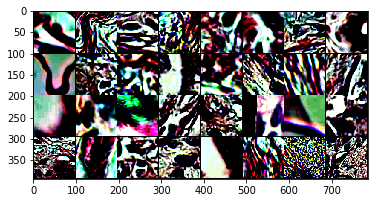

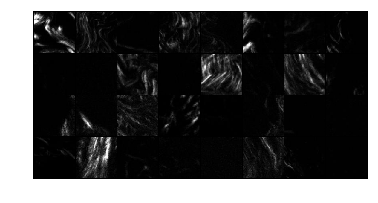

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


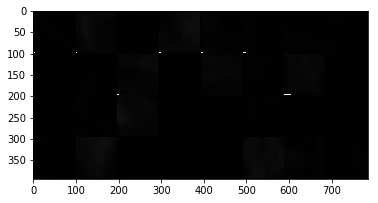

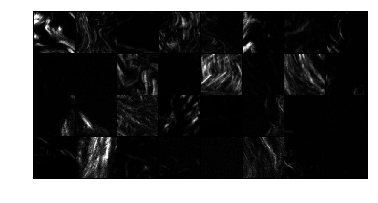

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


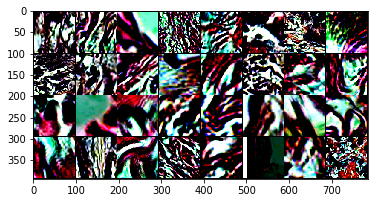

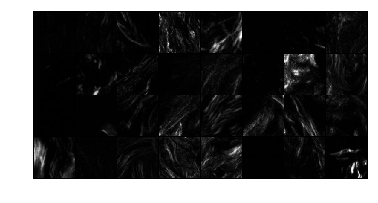

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


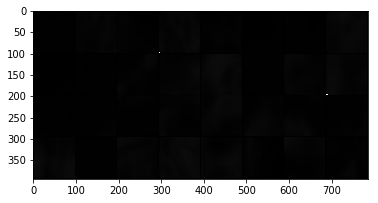

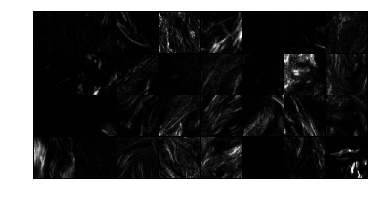

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


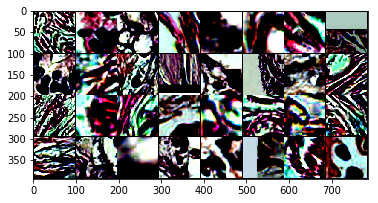

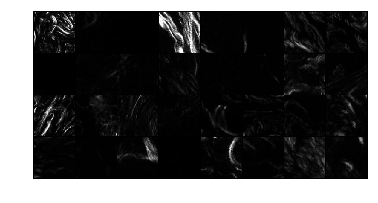

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


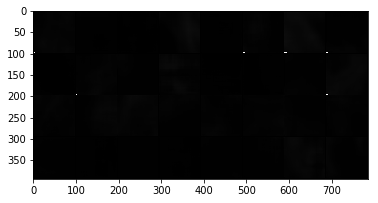

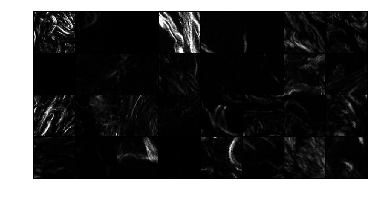

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


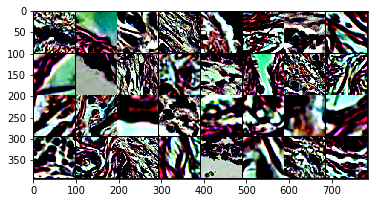

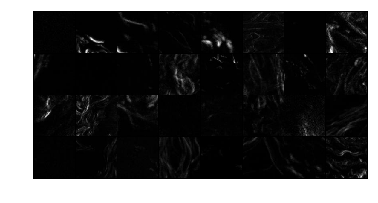

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


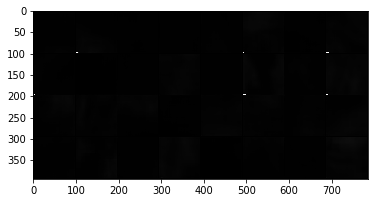

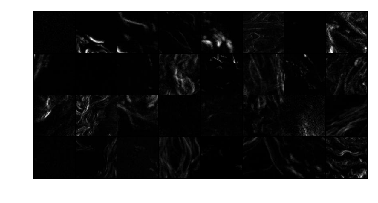

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


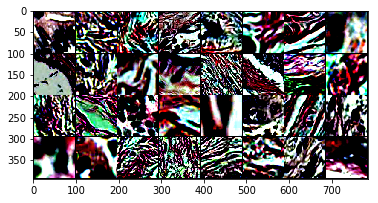

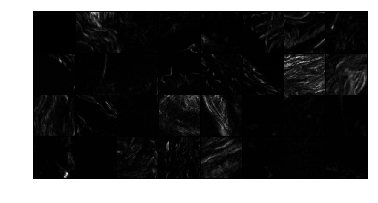

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


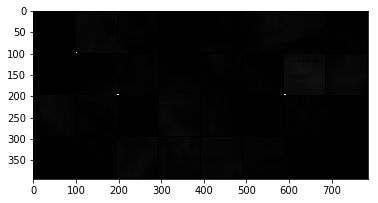

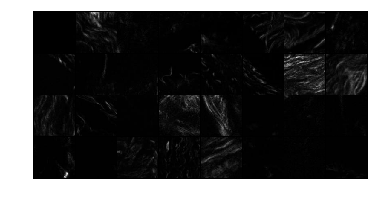

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


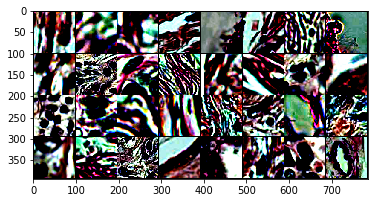

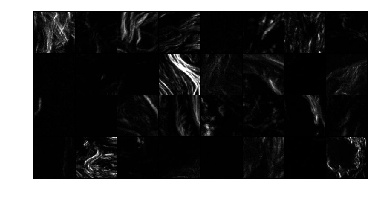

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


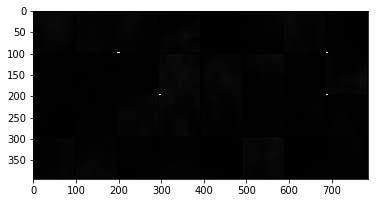

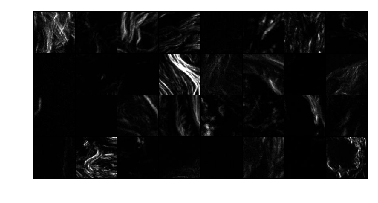

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


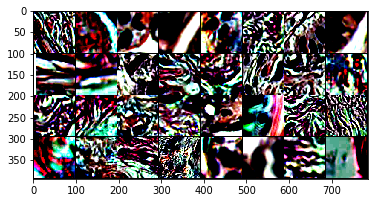

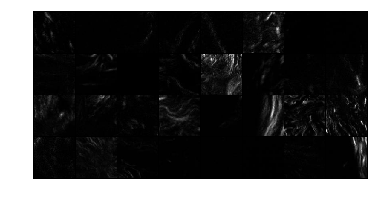

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


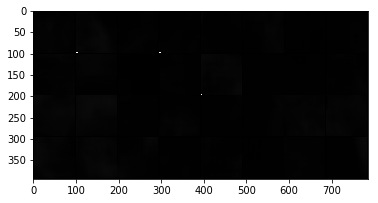

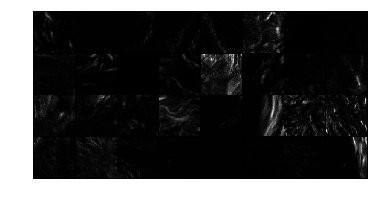

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


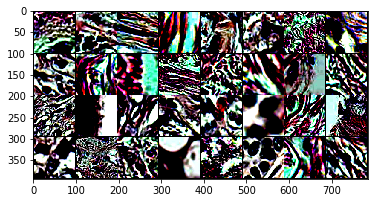

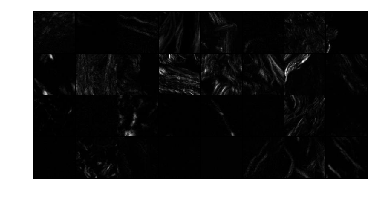

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


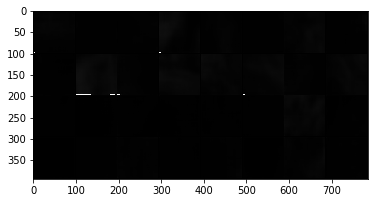

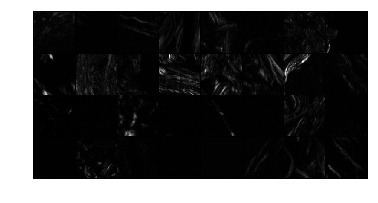

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


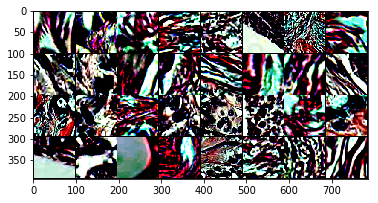

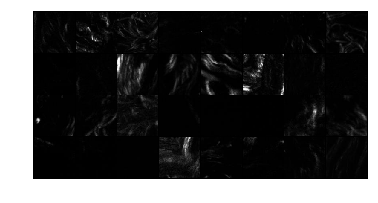

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


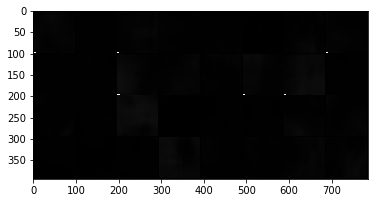

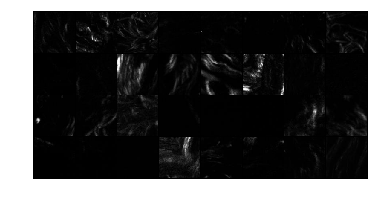

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


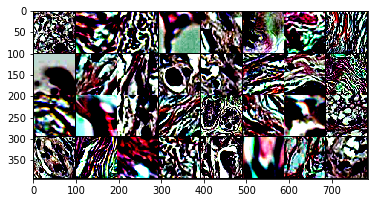

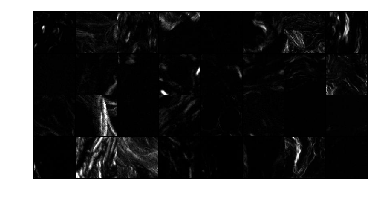

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


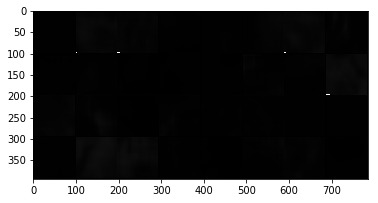

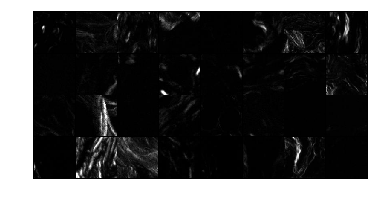

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


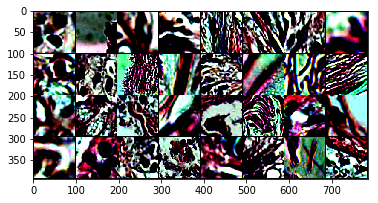

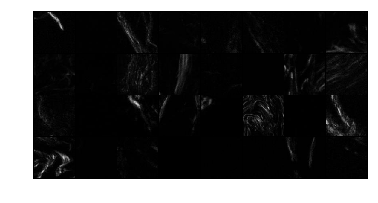

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


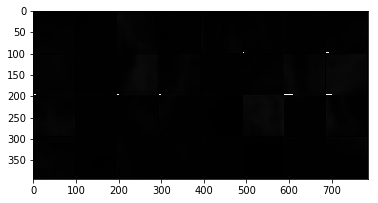

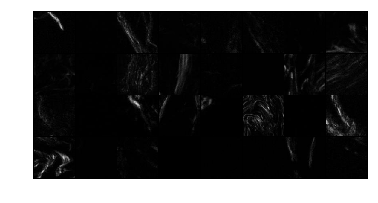

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


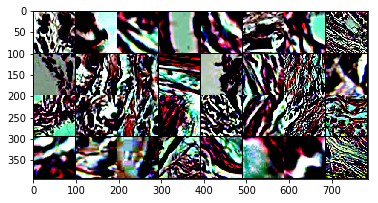

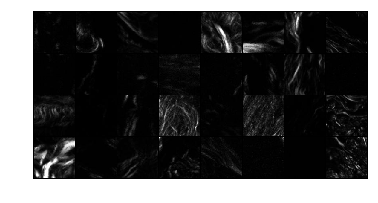

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


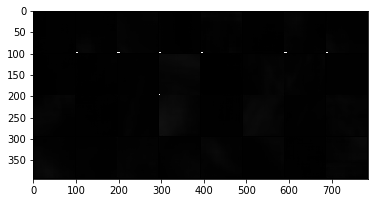

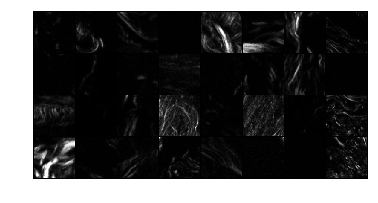

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


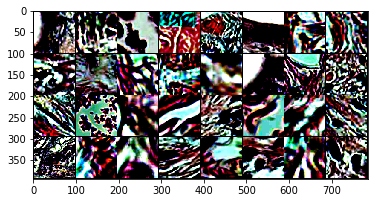

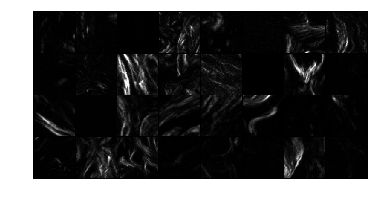

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


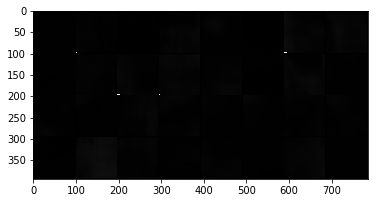

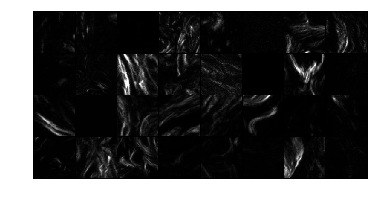

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


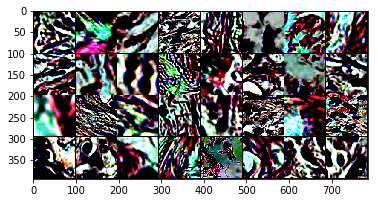

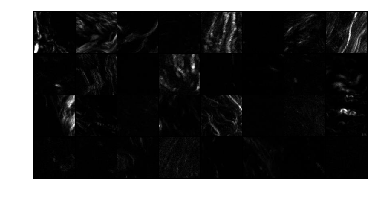

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


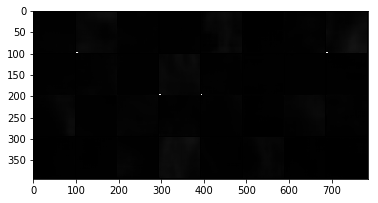

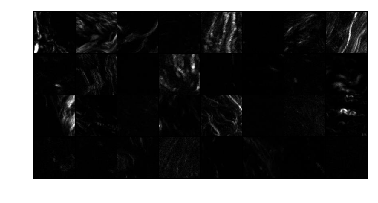

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


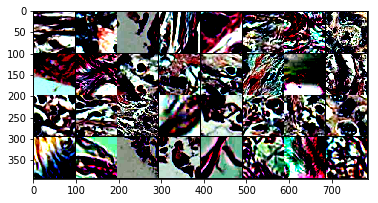

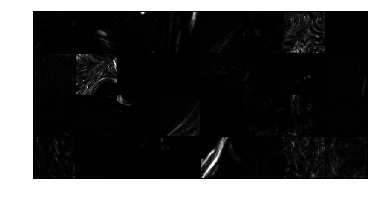

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


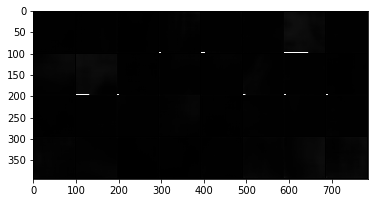

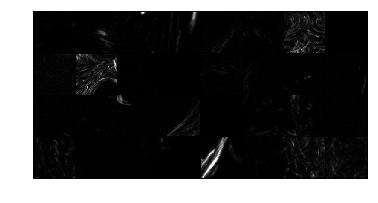

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


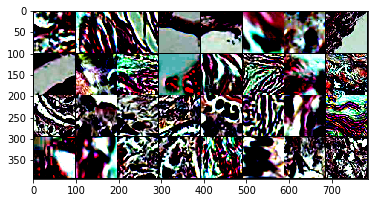

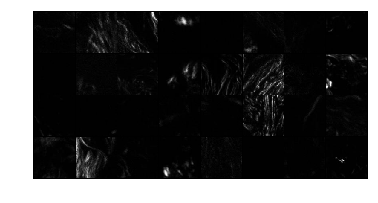

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


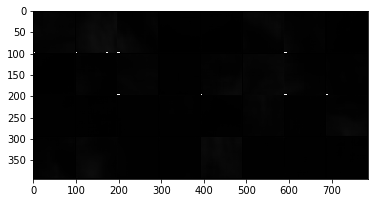

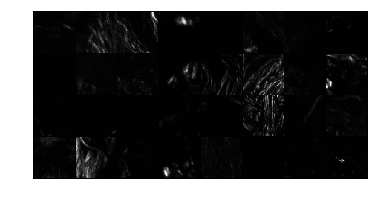

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([32, 1, 96, 96])


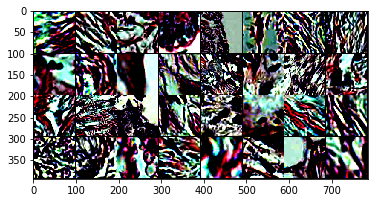

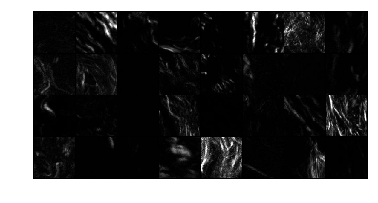

torch.Size([32, 1, 96, 96]) torch.Size([32, 1, 96, 96])
torch.Size([32, 1, 96, 96])


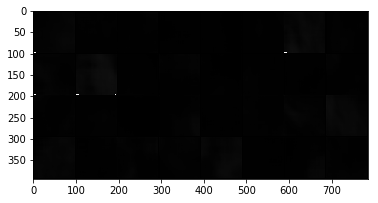

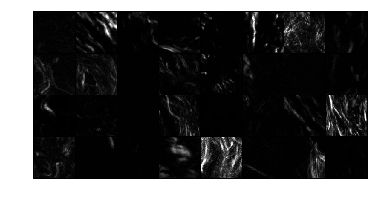

In [17]:
test()

In [18]:
l = 0.0001
p = 0
windowsize = 8
for epoch in range(1, 20 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*0.8
        l = l*0.2
        if windowsize == 0:
            windowsze = 1
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    train(epoch, p, windowsize)

lossMSE: 0.009230662137269974 lossSSIM: 0.26075953245162964
===> Epoch[1](0/25343): Loss: 0.2608
lossMSE: 0.005935058929026127 lossSSIM: 0.29026657342910767
===> Epoch[1](50/25343): Loss: 0.2903
lossMSE: 0.004771995823830366 lossSSIM: 0.289142370223999
===> Epoch[1](100/25343): Loss: 0.2891
lossMSE: 0.00858671311289072 lossSSIM: 0.31988632678985596
===> Epoch[1](150/25343): Loss: 0.3199
lossMSE: 0.003992925863713026 lossSSIM: 0.23650729656219482
===> Epoch[1](200/25343): Loss: 0.2365
lossMSE: 0.0049970424734056 lossSSIM: 0.25808459520339966
===> Epoch[1](250/25343): Loss: 0.2581
lossMSE: 0.013092521578073502 lossSSIM: 0.3013072609901428
===> Epoch[1](300/25343): Loss: 0.3013
lossMSE: 0.019060663878917694 lossSSIM: 0.3756104111671448
===> Epoch[1](350/25343): Loss: 0.3756
lossMSE: 0.0032370469998568296 lossSSIM: 0.22226983308792114
===> Epoch[1](400/25343): Loss: 0.2223
lossMSE: 0.0024115408305078745 lossSSIM: 0.22769933938980103
===> Epoch[1](450/25343): Loss: 0.2277
lossMSE: 0.0069291

KeyboardInterrupt: 

In [19]:
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Saved model', 'encoderresinfoallshuffle.pth')
torch.save(model.state_dict(), path)

In [ ]:
model = md.Net()
model.load_state_dict(torch.load(path))
model.eval()
model.to(device)